<div style="border:solid red 1px; padding: 20px">
<b>Сообщение ревьюеру:</b>     
    
Привет! Я Евгений. Прежде чем ты начнёшь проверять мой проект, прочитай этот дисклеймер.   

Я буду писать лично тебе в таких красных рамках по ходу проекта. Он был сложным и у меня возникли некоторые трудности, которые я прокомментирую и по поводу которых задам вопросы по ходу.   
    
    
Желательно, не перезапускай выполнение ноутбука, (если у тебя нет хорошего GPU). У меня в проекте нет ссылок на локальные файлы (кроме учебных), так что он будет работать. Однако, в коде присутствует обучение 4 вариантов нейросети, и получение эмбеддингов тоже (в случае с моей аппаратурой) не быстрое. 

# Разработка модели для фотохостинга
## Хостинг "With Sense"

### Описание
Пользователи размещают фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.   

### Задача
Разработать модель сопоставления тектосвого описания (запроса) с наиболее подходящим под него изображением. Подготовить Proof of concept для демонстрации реализации проекта.    

### План работы
- Подготовка среды к работе (загрузка библиотек, установка настроек)
- Загрузка данных
- Обзор данных
- Анализ и трансформация целевого признака (подгонка таргета под нужды проекта)
- Анализ качества трансформации целевого признака
- Получение эмбеддингов текстовых запросов и изображений
- Подготовка данных для обучения
- Линейная регрессия
- Полносвязная нейросеть (будет разработано и проверено несколько вариантов сети)
- Использование модели CLIP
- Проверка лучшей модели на валидационной выборке
- Проверка лучшей модели на тестовой выборке

### Подготовка к работе, загрузка библиотек

In [1]:
import os
import itertools
import string
import time
import re
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

# !pip install --upgrade sklearn --quiet
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import (f1_score, confusion_matrix, accuracy_score,
                             recall_score, mean_squared_error, mean_absolute_error, r2_score)

from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression

# !pip uninstall tensorflow
# !pip install tensorflow
# from keras import backend
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.metrics import RootMeanSquaredError, Recall
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import BatchNormalization, Dropout, LeakyReLU, GlobalAveragePooling2D, Dense
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy, MeanSquaredError, MeanAbsoluteError
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.optimizers import Adam

!pip install --upgrade transformers --quiet
from transformers import CLIPProcessor, CLIPModel

try: 
    from PIL import Image
except ModuleNotFoundError:
    !pip install PIL --quiet
    from PIL import Image

try:
    from imblearn.over_sampling import SMOTE
except ModuleNotFoundError:
    !pip install imblearn --quiet
    from imblearn.over_sampling import SMOTE

try:
    import spacy
except ModuleNotFoundError:
    !pip install spacy --quiet
    import spacy
    
try:
    import joblib
except ModuleNotFoundError:
    !pip install joblib --quiet
    import joblib

try:
    from gensim.models import FastText
except ModuleNotFoundError:
    !pip install gensim --quiet
    from gensim.models import FastText
    
try:
    from tqdm.notebook import tqdm
except ModuleNotFoundError:
    !pip install tqdm --quiet
    from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
try:
    import seaborn as sns
except ModuleNotFoundError:
    !pip install seaborn --quiet
    import seaborn as sns
sns.set(font_scale = 1.1, style="darkgrid",)

In [2]:
%config Completer.use_jedi = False

RANDOM_ST = 1000 # random state

FOLDER = 'to_upload'
TEST_IMG_FOLDER = 'test_images'
TRAIN_IMG_FOLDER = 'train_images'

UNADULTS_STRING = 'boy|girl|child|children|teenager|toddler|infant|baby|adolescent|kid|schoolboy|schoolgirl|teen'

print(os.listdir(FOLDER))

['.DS_Store', 'CrowdAnnotations.tsv', 'ExpertAnnotations.tsv', 'test_images', 'test_images.csv', 'test_queries.csv', 'train_dataset.csv', 'train_images']


### Загрузка данных

In [3]:
train_dataset = pd.read_csv(FOLDER + '/train_dataset.csv', sep=',')
test_images = pd.read_csv(FOLDER + '/test_images.csv', sep='|')
test_queries = pd.read_csv(FOLDER + '/test_queries.csv', sep='|', index_col=0)

In [5]:
display(train_dataset.head(3).style.set_caption('train_dataset'))
print(train_dataset.shape)
print(f"Уникальных изображений в тренировочной выборке: {train_dataset['image'].nunique()}")
display(test_images.head(3).style.set_caption('test_images'))
print(test_images.shape)
display(test_queries.head(3).style.set_caption('test_queries'))
print(test_queries.shape)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


(5822, 3)
Уникальных изображений в тренировочной выборке: 1000


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg


(100, 1)


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg


(500, 3)


В нашем распоряжении 1000 учебных изображений и 100 тестовых.

In [6]:
expert_annotations = pd.read_table(FOLDER + '/ExpertAnnotations.tsv', header=None)
expert_annotations.columns = ['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']
crowd_annotations = pd.read_table(FOLDER + '/CrowdAnnotations.tsv', header=None)
crowd_annotations.columns = ['image', 'query_id', 'crowd_aprovement_share',
                             'crowd_query_approved', 'crowd_query_not_approved']

In [7]:
display(expert_annotations.head(3).style.set_caption('expert_annotations'))
print(expert_annotations.shape)
display(crowd_annotations.head(3).style.set_caption('crowd_annotations'))
print(crowd_annotations.shape)

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2


(5822, 5)


,image,query_id,crowd_aprovement_share,crowd_query_approved,crowd_query_not_approved
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3


(47830, 5)


Сторонние ассессоры проверили в 8 раз больше пар изображение-текст. Вероятно, это позволит точнее подобрать целевой признак в следующем разделе.

### Анализ целевого признака

Проверим сколько краудсорсинговых оценщиков приходится на различные пары запрос-изображение.

In [8]:
crowd_annotations['crowd_participants_cnt'] = (
            crowd_annotations['crowd_query_approved'] +
            crowd_annotations['crowd_query_not_approved']
    )

print('Количество оценщиков на каждый запрос:')
print(crowd_annotations['crowd_participants_cnt'].value_counts())
print()
print()
print('Доля подтверждаений качества для каждого запроса:')
print(crowd_annotations['crowd_aprovement_share'].value_counts())

Количество оценщиков на каждый запрос:
crowd_participants_cnt
3    46780
4      780
5      220
6       50
Name: count, dtype: int64


Доля подтверждаений качества для каждого запроса:
crowd_aprovement_share
0.000000    41970
0.333333     3000
0.666667     1360
1.000000     1323
0.250000       96
0.500000       27
0.200000       22
0.750000        9
0.600000        8
0.400000        8
0.800000        4
0.166667        3
Name: count, dtype: int64


На каждую пару запрос-изображение приходится от 3 до 6 оценщиков. Большинство соответствий имеют оценку 0.    

Проверим как распределены оценки экспертов.  

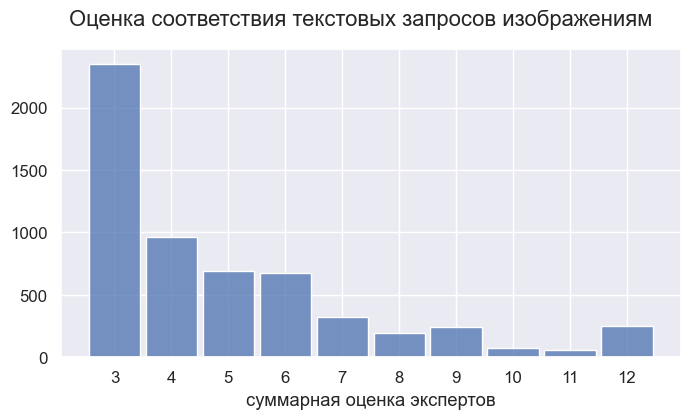

In [9]:
expert_annotations['sum'] = (expert_annotations['expert_1'] +
                              expert_annotations['expert_2'] +
                              expert_annotations['expert_3'])

fig, ax = plt.subplots(figsize=(8, 4))

sns.histplot(expert_annotations['sum'], discrete=True, shrink=.9)

plt.xticks([i for i in range(expert_annotations['sum'].min(),
                             expert_annotations['sum'].max() + 1)])

plt.xlabel('суммарная оценка экспертов')
plt.ylabel('')
plt.suptitle('Оценка соответствия текстовых запросов изображениям')
plt.show()
plt.close()

Минимальный балл присуждаемый каждым из 3 экспертов - 1, максимальный 3.   

Таким образом, 3 балла означают полное несоответствие запроса изображению, 12 баллов - означают полное соответствие.

In [10]:
expert_annotations_groupby = expert_annotations.groupby('image', as_index=0).agg({'query_id': 'count'})
crowd_annotations_groupby = crowd_annotations.groupby('image', as_index=0).agg({'query_id': 'count'})

print("\033[1mТаблица crowd_annotations\u001b[0m")
print(f"Всего аннотаций: {crowd_annotations.shape[0]}")
print(f"Уникальных изображений: {crowd_annotations['image'].nunique()}")
print(f"Уникальных аннотаций: {crowd_annotations['query_id'].nunique()}")
print(f"Максимальное количество аннотаций на изображение: {crowd_annotations_groupby['query_id'].max()}")
print(f"Среднее количество аннотаций на изображение: {crowd_annotations_groupby['query_id'].mean():.0f}")
print()
print("\033[1mТаблица expert_annotations\u001b[0m")
print(f"Всего аннотаций: {expert_annotations.shape[0]}")
print(f"Уникальных изображений: {expert_annotations['image'].nunique()}")
print(f"Уникальных аннотаций: {expert_annotations['query_id'].nunique()}")
print(f"Максимальное количество аннотаций на изображение: {expert_annotations_groupby['query_id'].max()}")
print(f"Среднее количество аннотаций на изображение: {expert_annotations_groupby['query_id'].mean():.0f}")


Таблица crowd_annotations
Всего аннотаций: 47830
Уникальных изображений: 1000
Уникальных аннотаций: 1000
Максимальное количество аннотаций на изображение: 120
Среднее количество аннотаций на изображение: 48

Таблица expert_annotations
Всего аннотаций: 5822
Уникальных изображений: 1000
Уникальных аннотаций: 977
Максимальное количество аннотаций на изображение: 10
Среднее количество аннотаций на изображение: 6


Из этого также следует, что краудсорсинговые оценщики оценили гораздо больше пар запрос-изображение. В данных есть пары, оценённые **только** краудсорсинговыми оценщиками (на 1000 картинок у экспертов 977 аннотаций).     

В данном разделе:
- загружены и исследованы данные
- изучен целевой признак

### Анализ изображений
Проверим адекватность оценок экспертов и краудсорса.

In [11]:
"""функция для сравнения лучшего текста запроса краудсорса и экспертов для одного из изображений.
   Задается порог выше или ниже которого сумма баллов экспертов"""
def qaries_comparing(threshold=9, more_or_less='more', random_state=None): 
    expert_annotations_grpby_sum = (
            expert_annotations
                .groupby('image', as_index=False)
                .agg({'sum': 'max'})
        )
    
    # переключатель: если 'more' - случайный запрос ищется выше порога аппрува, если 'less' - наоборот
    if more_or_less == 'more':
        grpby = expert_annotations_grpby_sum[expert_annotations_grpby_sum['sum'] > threshold]
    if more_or_less == 'less':
        grpby = expert_annotations_grpby_sum[expert_annotations_grpby_sum['sum'] < threshold]
    
    # выбор случайного изображения
    bad_expert_estimation_random_image = (
            grpby
                .sample(random_state=random_state)['image']
                .ravel()[0]
        )
    
    # лучшая аннотация экспертов к нему
    best_expert_annotation = (
            expert_annotations[
                expert_annotations['image'] == bad_expert_estimation_random_image
            ]
            .nlargest(1, 'sum')['query_id']
            .ravel()[0]
        )
    
    # лучшая аннотация крауда
    best_crowd_annotation = (
            crowd_annotations[
                crowd_annotations['image'] == bad_expert_estimation_random_image
            ]
            .nlargest(1, 'crowd_aprovement_share')['query_id']
            .ravel()[0]
        )

    best_expert_annotation_text = train_dataset[train_dataset['query_id'] == best_expert_annotation]['query_text'].values[0]
    best_crowd_annotation_text = train_dataset[train_dataset['query_id'] == best_crowd_annotation]['query_text'].values[0]

    fig, ax = plt.subplots(2, 1, figsize=(8, 8), height_ratios=[4.5, 1])
    plt.grid(False)
    plt.sca(ax[0])

    plt.imshow(load_img(FOLDER + '/' + TRAIN_IMG_FOLDER + '/' + bad_expert_estimation_random_image))


    plt.xticks([])
    plt.yticks([])
    plt.sca(ax[1])
    plt.text(x=0.02, y=0.9, fontsize=10, s='best expert estimated text:\n' +
             best_expert_annotation_text + '\n\n\nbest crowd estimated text:\n'
             + best_crowd_annotation_text,
             ha='left', va='top', c='black',  transform=ax[1].transAxes)
    plt.xticks([])
    plt.yticks([])

    plt.tight_layout()
    plt.show()
    plt.close()

Далее несколько примеров.   

Сначала пример, где наивысшая оценка экспертов не является максимальной.

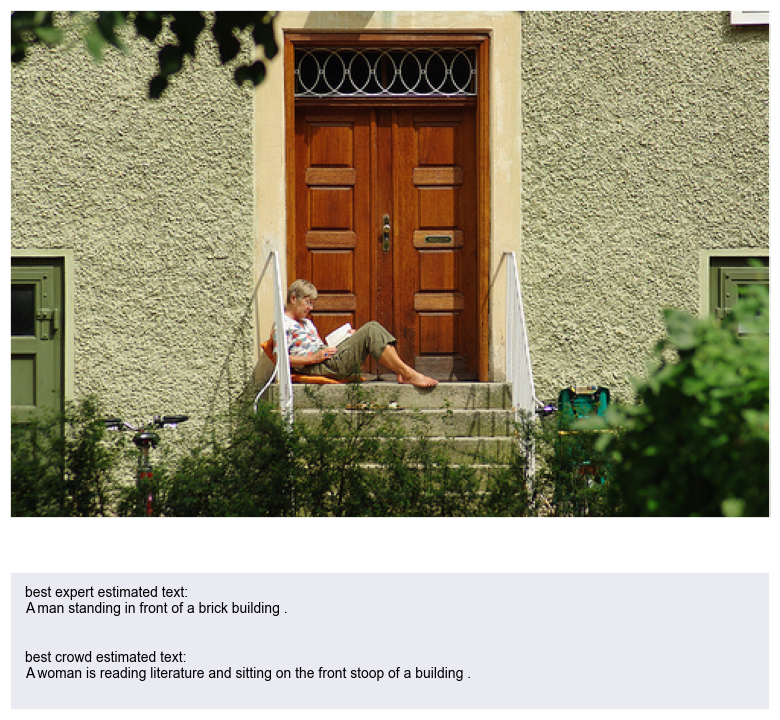

In [12]:
qaries_comparing(threshold=9, more_or_less='less', random_state=500)

Лучший запрос краудсорса оказался более подходящим чем лучший запрос экспертов.   

Еще один пример.

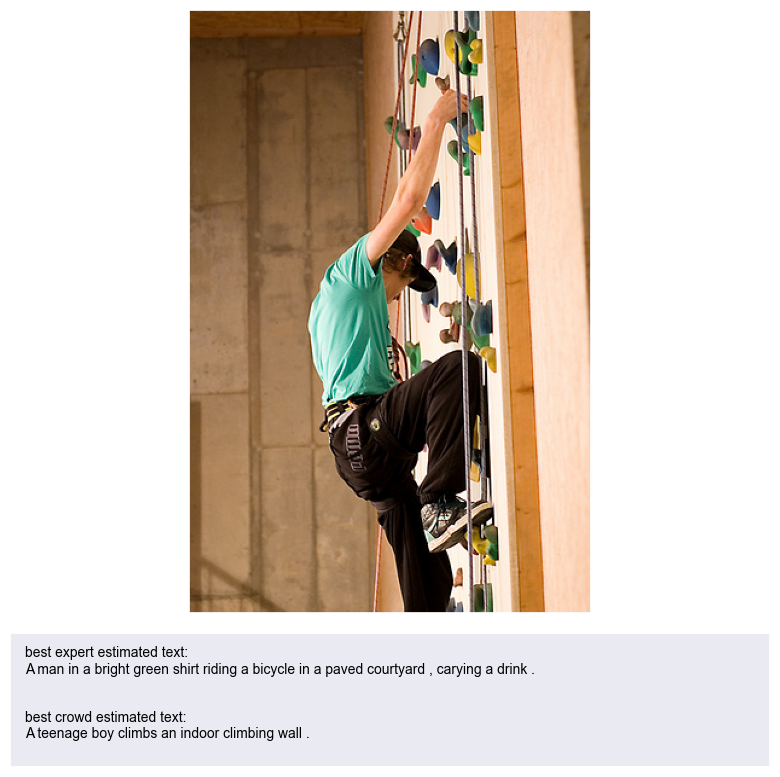

In [13]:
qaries_comparing(threshold=9, more_or_less='less', random_state=200)

В данном случае ситуация аналогичная.

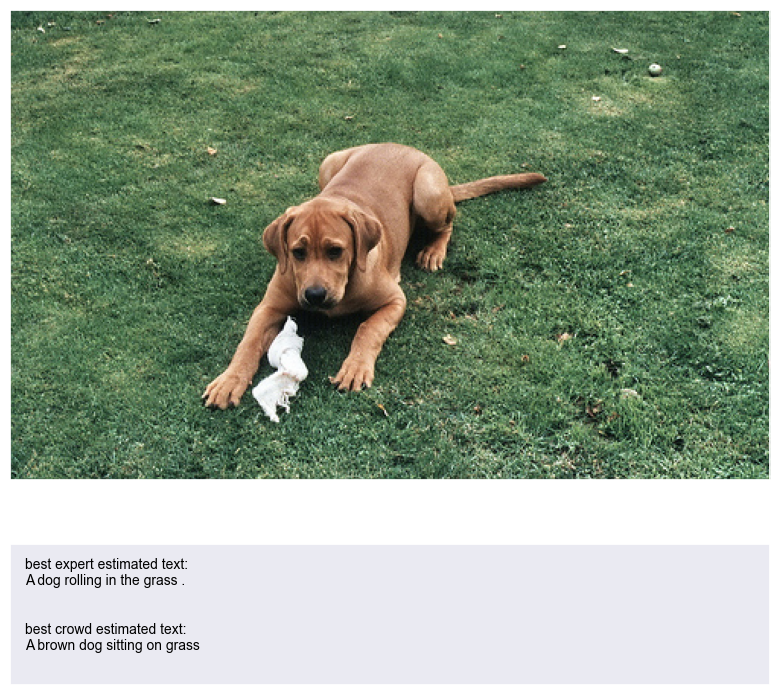

In [14]:
qaries_comparing(threshold=9, more_or_less='less', random_state=1234)

В данном случае запросы близки но не совпадают.   

Понизим порог оценки экспертов.

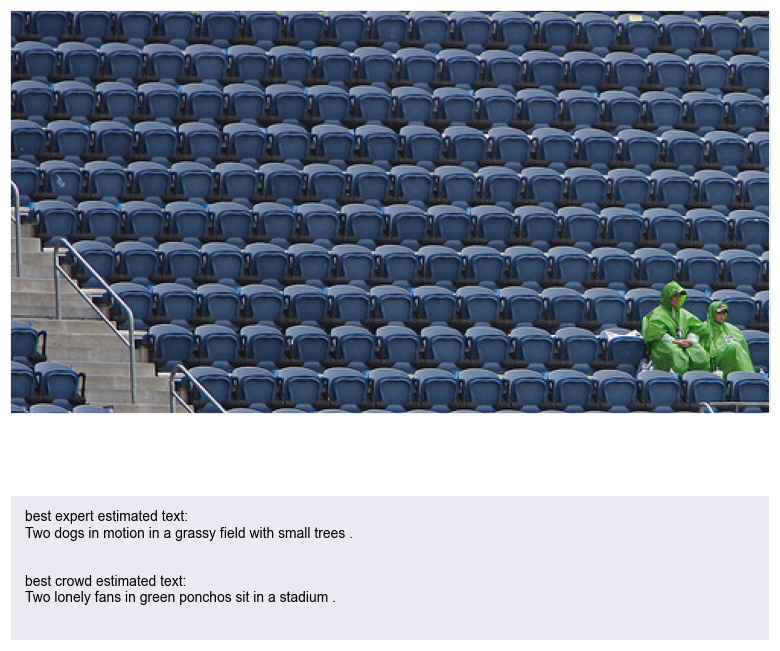

In [15]:
qaries_comparing(threshold=6, more_or_less='less', random_state=10)

В данном случае оценка экспертов неприемлема, и актуальна только оценка краудсорса. Возможно именно это изображение в сочетании с наилучшим запросом эксперты не оценивали.    

Теперь проверим ситуацию, когда оценки экспертов и краудсорса сходятся.

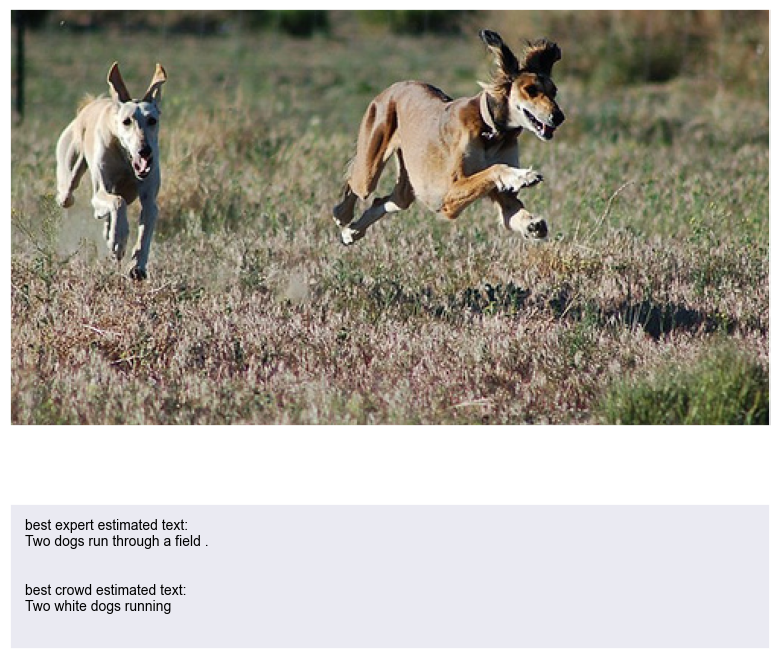

In [16]:
qaries_comparing(threshold=10, more_or_less='more', random_state=500)

В данном случае оценка экспертов оказалась лучше.

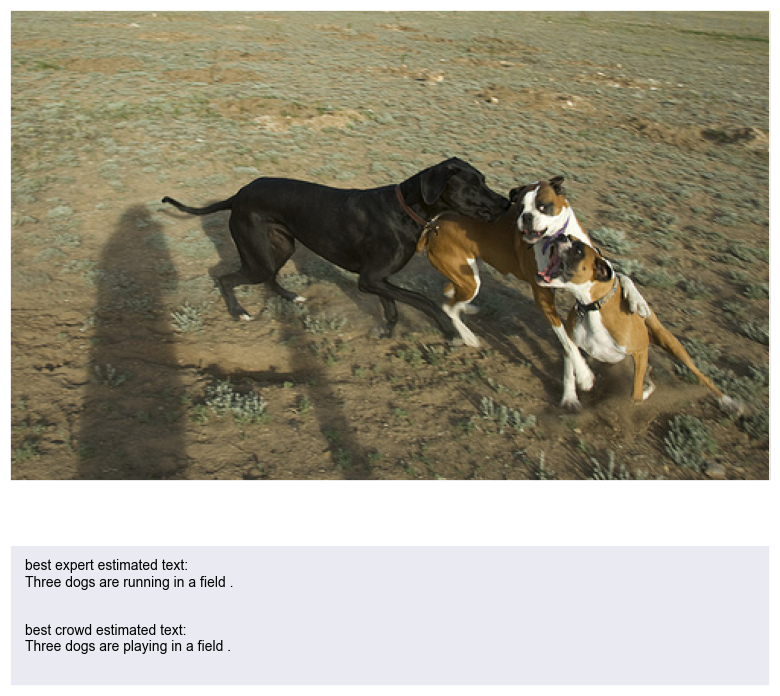

In [17]:
qaries_comparing(threshold=10, more_or_less='more', random_state=1234)

Тут обе группы выбрали наиболее подходящей одну и ту же картинку.

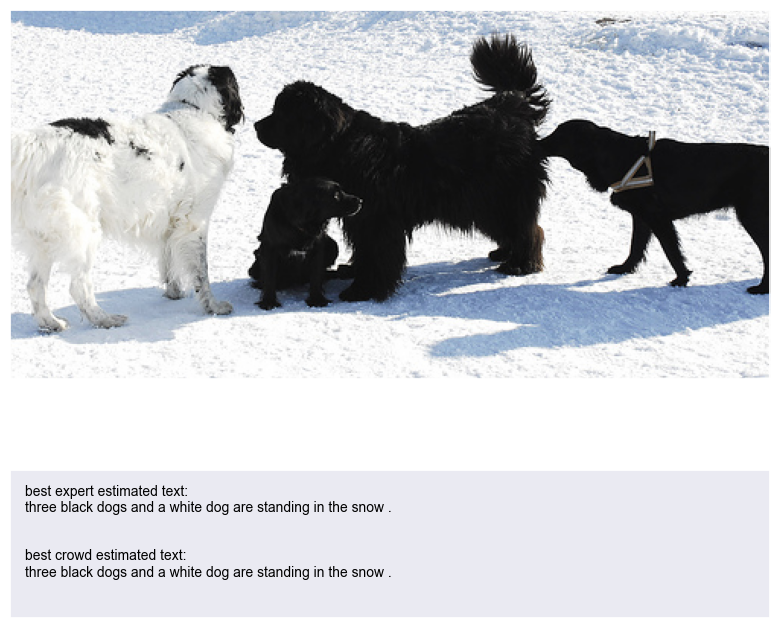

In [18]:
qaries_comparing(threshold=11, more_or_less='more', random_state=600)

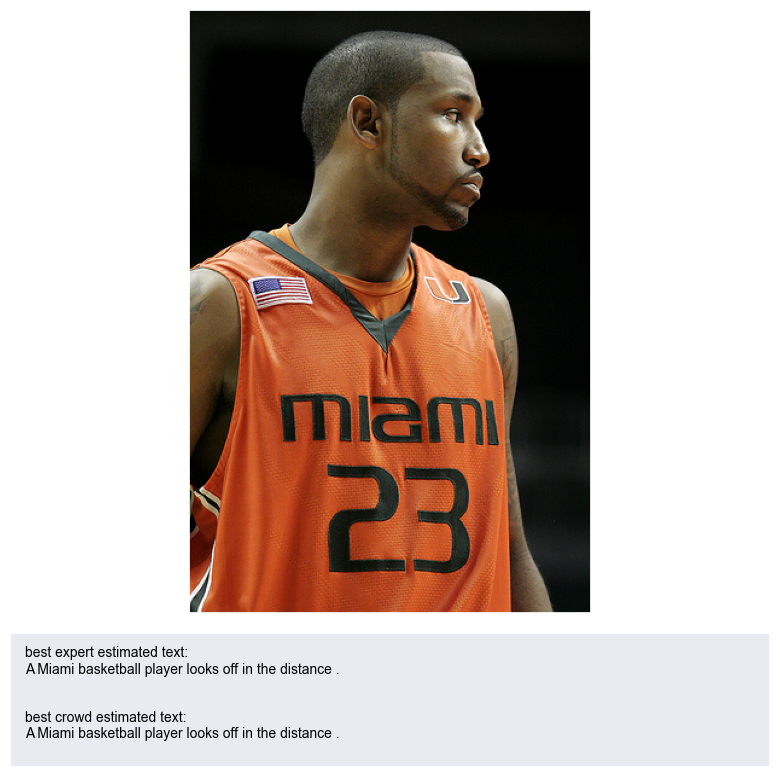

In [19]:
qaries_comparing(threshold=11, more_or_less='more', random_state=800)

Выше - аналогичные позитивные примеры.    

Уберём ненужное смещение для экспертных оценок (минимальная оценка 3, после изменений будет 0).

In [20]:
annotations_full = (
        crowd_annotations
            .merge(expert_annotations,
                   on=['image', 'query_id'],
                   how='outer')
    )

annotations_full['sum'] = annotations_full['sum'] - 3

Масштабируем оценку экспертов.

In [21]:
annotations_scaler = MinMaxScaler()

annotations_full['sum_scaled'] = (
        annotations_scaler
            .fit_transform(annotations_full['sum']
                               .to_numpy()
                               .reshape(-1, 1))
            .reshape(1, -1)[0]
    )

display(annotations_full.head(3))
display(annotations_full.tail(3))

,image,query_id,crowd_aprovement_share,crowd_query_approved,crowd_query_not_approved,crowd_participants_cnt,expert_1,expert_2,expert_3,sum,sum_scaled
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3.0,0.0,3.0,NaN,NaN,NaN,NaN,NaN
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN


,image,query_id,crowd_aprovement_share,crowd_query_approved,crowd_query_not_approved,crowd_participants_cnt,expert_1,expert_2,expert_3,sum,sum_scaled
51320,997722733_0cb5439472.jpg,2968182121_b3b491df85.jpg#2,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0
51321,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0
51322,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0


Пропуски в данных, учитывающих и те и другие оценки, обусловлены тем, что некоторые пары оценивали **только** эксперты, а некоторые - **только** сторонние ассессоры.  


Совместим оценки экспертов и крауда. Логика функции следующая:   
- если максимальная оценка экспертов для группы запросов к одному изображению низкая, больший вес приобретает оценка крауда.
- если оценка максимальная - вес разделён поровну между экспертами и краудом.
- в случае если в одной из групп для определенного изображения нет оценок (изображение не оценивалось группой), принимается оценка другой группы.    

Также удалим получившиеся строки без текста запроса.

In [22]:
def weighted_score(x):
    if x['crowd_aprovement_share'] == 0:
        w_expt = 1
        w_crwd = 0
    elif x['crowd_aprovement_share'] == 1:
        if x['sum_scaled'] == 0:
            w_expt = 0
            w_crwd = 1
        elif x['sum_scaled'] > 0.8:
            w_expt = 0.5
            w_crwd = 0.5
        else:
            w_expt = x['sum_scaled'] / 2
            w_crwd = 1 - w_expt
    else:
        w_expt = 0.5
        w_crwd = 0.5
    return w_expt, w_crwd

def get_final_annonation_est(x):
    if x['sum_scaled'] == -1:
        return x['crowd_aprovement_share']
    elif x['crowd_aprovement_share'] == -1:
        return x['sum_scaled']
    else:
        return x['sum_scaled'] * x['w1'] + x['crowd_aprovement_share'] * x['w2']  

In [23]:
annotations_full_grouped = (
        annotations_full
            .groupby('image', as_index=False, dropna=False)
            .agg({'sum_scaled': 'max',
                  'crowd_aprovement_share': 'max'})    )

annotations_full_grouped[['w1', 'w2']] = annotations_full_grouped.apply(weighted_score, result_type='expand', axis=1)

annotations_full = (
        annotations_full
            .copy()
            .merge(annotations_full_grouped[['image', 'w1', 'w2']],
                   on='image',
                   how='left')
    )

annotations_full = annotations_full.fillna(-1)

annotations_full['query_approvement'] = annotations_full.apply(get_final_annonation_est, axis=1)

annotations_full = (
        annotations_full
            .merge(train_dataset[['query_id', 'query_text']].drop_duplicates(),
                   on = 'query_id',
                   how='left')
    )

print(f"Нет текстов: {len(annotations_full[annotations_full['query_text'].isna()])}")
print('Пример поиска текста запроса по id, которого нет в итоговой выборке:')
display(train_dataset[train_dataset['query_id'] == annotations_full[annotations_full['query_text'].isna()].sample()['query_id'].ravel()[0]])
annotations_full = annotations_full.dropna(subset='query_text').reset_index(drop=True)
print()
print()
print(f"Нет текстов после dropna: {len(annotations_full[annotations_full['query_text'].isna()])}")

Нет текстов: 1109
Пример поиска текста запроса по id, которого нет в итоговой выборке:


,image,query_id,query_text




Нет текстов после dropna: 0


Объединим резульат в одном датафрейме

In [24]:
train_data = annotations_full.copy(deep=True)[['image', 'query_id', 'query_text', 'query_approvement']]

display(train_data.head())
print(train_data.shape)

,image,query_id,query_text,query_approvement
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0


(50214, 4)


Проверим адекватность синтетической оценки соответствия изображений и запросов.

In [25]:
def pick_train_image(rate_of_approvement=.5, exact_image=None, random_state=None):
    
    if not exact_image:
        rand_img = train_data[(train_data['query_approvement'] > rate_of_approvement - 0.1) &
                              (train_data['query_approvement'] < rate_of_approvement + 0.1)].sample(random_state=random_state)

        plt.grid(False)
        plt.imshow(load_img(FOLDER + '/' + TRAIN_IMG_FOLDER + '/' + rand_img['image'].ravel()[0]))
        
        plt.xticks([])
        plt.yticks([])

        plt.show()
        plt.close()
        
        print(f"rate of approvement:   {rand_img['query_approvement'].ravel()[0]:.4f}")
        print(f"query text:            {rand_img['query_text'].ravel()[0]}")
        
    else:
        plt.grid(False)
        plt.imshow(load_img(FOLDER + '/' + TRAIN_IMG_FOLDER + '/' + exact_image))

        plt.xticks([])
        plt.yticks([])

        plt.show()
        plt.close()

В первую очередь проверим полностью совпадающие с изображениями запросы.

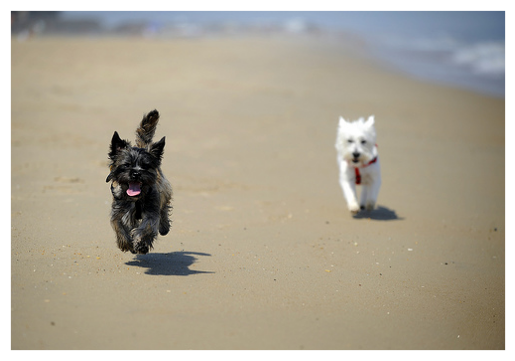

rate of approvement:   1.0000
query text:            Two dogs playing on the beach .


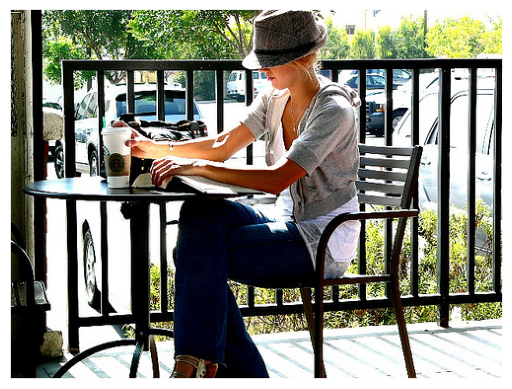

rate of approvement:   1.0000
query text:            a woman enjoying her reading at a coffee shop


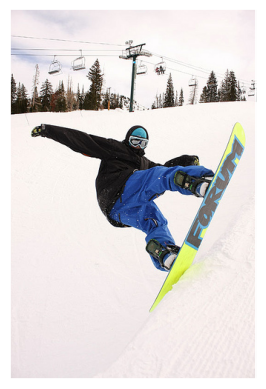

rate of approvement:   1.0000
query text:            A person riding a snowboard jumps high over the snowy hill .


In [26]:
pick_train_image(1)
pick_train_image(1)
pick_train_image(1)

Оценки выглядят адекватными.    

Также проверим полностью несовпадающие пары.

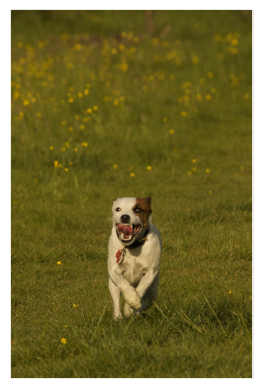

rate of approvement:   0.0000
query text:            Brown and white dog runs through brush .


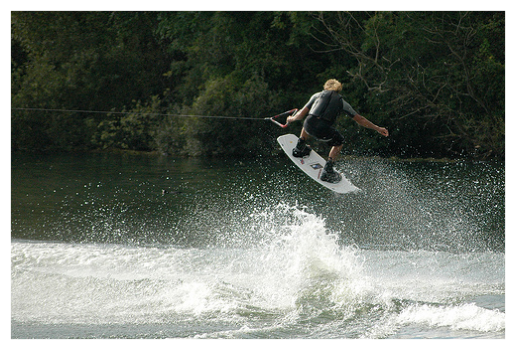

rate of approvement:   0.0000
query text:            A dog jumping through the air getting hit by water .


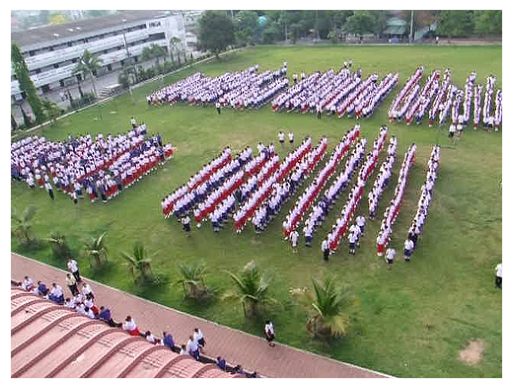

rate of approvement:   0.0000
query text:            Two people on a motorcycle .


In [27]:
pick_train_image(0)
pick_train_image(0)
pick_train_image(0)

Результат проверки также позитивный.   

В заключении проведём проверки трёх промежуточных вероятностей совпадения.

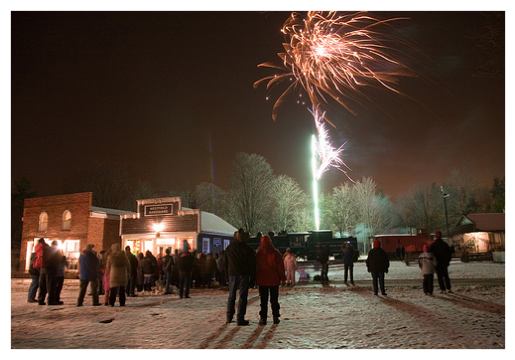

rate of approvement:   0.1111
query text:            A man at a rodeo is thrown off a horse .


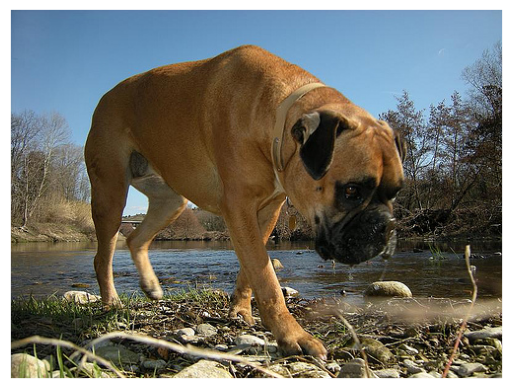

rate of approvement:   0.4028
query text:            A tan dog jumps into water .


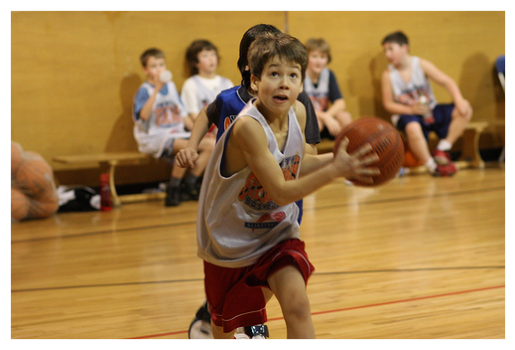

rate of approvement:   0.8333
query text:            A boy wearing a Steve Nash shirt dribbles a basketball on an indoor court .


In [28]:
pick_train_image(0.2)
pick_train_image(0.5)
pick_train_image(0.8)

Отметим изображения, которые не соответствуют политике компании - то есть те на которых присутствуют несовершеннолетние.

In [29]:
def unadults_tagging(text_col=train_data['query_text']):
    unadult_tags = UNADULTS_STRING
    return text_col.apply(lambda x: 1 if len(re.findall(unadult_tags, x)) > 0 else 0).tolist()

train_data['unadult_flag'] = unadults_tagging()

display(train_data[['query_text', 'unadult_flag']].head())

,query_text,unadult_flag
0,"A woman is signaling is to traffic , as seen f...",0
1,A boy in glasses is wearing a red shirt .,1
2,A young boy holds onto a blue handle on a pier .,1
3,"A woman wearing black clothes , a purple scarf...",0
4,An older woman with blond hair rides a bicycle...,0


<div style="border:solid red 1px; padding: 20px">
<b>Сообщение ревьюеру:</b>     
    
Подойдя к тестированию модели я понял, что эти метки при тренировке не были нужны, но на всякий случай оставил этот код.



В данном разделе:
- сформирована единая оценка соответствия изображений текстовым описаниям (целевой признак)
- проверено качество формирования оценки
- в тренировочной выборке промаркирован контент, который может попасть под законоадтельные ограничения

### Получение эмбеддингов
#### Текст     


Для получения эмбеддингов текста используем Fastext. На вход модели подаются уже лемматизированные запросы.

In [30]:
class GetTxtEmbeddings:
    
    def __init__(self):
        self.nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])
    
    # очистка текста
    def clear_text(self, x):
        text = ''.join([ch for ch in x if ch not in string.punctuation])
        text = re.sub(r"[\s]{2,}", ' ', text)
        text = re.sub(r"\s$|^\s", '', text)

        lemma = [token.lemma_ for token in self.nlp(text)]
        return lemma

    def clear_text_apply(self, data):
        return data.apply(self.clear_text)
    
    # получение эмбеддингов
    def fas_text(self, data, min_count=2, window=5, vector_size=100, sg=1):
        lemmatized = self.clear_text_apply(data)
        self.model = FastText(lemmatized,
                         min_count=min_count,
                         window=window,
                         vector_size=vector_size,
                         sg=sg)
        
        embd = [np.mean([self.model.wv[word] for word in txt if word in self.model.wv], axis=0) for txt in lemmatized]
        return embd
    
    # получение эмбеддингов для одной строки (для тестирования)
    def single_text(self, text):
        lemmatized = self.clear_text(text)
        embd = np.mean([self.model.wv[word] for word in lemmatized if word in self.model.wv], axis=0)
        return embd

In [31]:
text_transformer = GetTxtEmbeddings()
text_embeddings = np.array(text_transformer.fas_text(data=train_data['query_text'], vector_size=512))
print('Проверка:')
print(text_transformer.single_text('Hello world')[:20], '...')
print(text_embeddings.shape)

Проверка:
[ 0.08283541  0.16180046  0.04091655  0.07856943 -0.06376423 -0.0700885
  0.14960578  0.12182868  0.01908543 -0.03568191  0.13019058  0.01473919
  0.04902105  0.0402823  -0.09322879  0.06703857 -0.00373254 -0.10947236
 -0.00759573 -0.12982656] ...
(50214, 512)


In [ ]:
# joblib.dump(text_transformation_result, filename='text_embeddings512.joblib', compress=2)

In [ ]:
# text_embeddings = joblib.load('text_embeddings.joblib')
# text_embeddings = joblib.load('text_embeddings256.joblib')
# text_embeddings = joblib.load('text_embeddings512.joblib')

В итоговом наборе 512 признаков.

<div style="border:solid red 1px; padding: 20px">
<b>Сообщение ревьюеру:</b>     
    
В этом разделе я решил попробовать новый для меня инструмент Fastext. В одном из прошлых проектов уже использовал для этих целей BERT. По твоему мнению, что лучше?

#### Изображения   
Аналогичным образом получим эмбеддинги для изображений. Для этого, согласно техническому заданию, используется сверточная сеть ResNet50.

In [32]:
class GetImgEmbeddings:
    
    def __init__(self):
        self.model = None
    
    def create_embedding_model(self, input_shape):
        self.input_shape = input_shape
        backbone = ResNet50(input_shape=self.input_shape,
                            weights='imagenet',
                            include_top=False)
        
        model = Sequential()
        model.add(backbone)
        model.add(GlobalAveragePooling2D())
#         model.add(Dense(512, activation='relu'))

        return model
    
    def get_embeddings(self, folder_path, images_list=None, shape=(280, 280, 3)):
        self.folder_path = folder_path
        self.images_list = images_list
        self.shape = shape
        
        if not self.images_list:
            self.images_list = os.listdir(folder_path)
        
        embeddings = []
        
        if not self.model:
            self.model = self.create_embedding_model(self.shape)
        
        for file in tqdm(self.images_list):
            img = load_img(folder_path + '/' + file, target_size=(self.shape[0], self.shape[1]))
            img_nmpy = img_to_array(img) / 255
            
            embedding = self.model.predict(np.expand_dims(img_nmpy, axis=0), verbose=0)           
            embeddings.append(embedding)  
            
        return np.squeeze(np.array(embeddings), axis=1), self.images_list

    # Метод для получения эмбеддинга отдельного изображения (для тестирования)
    def single_image(self, image_path):
        img = load_img(image_path, target_size=(self.shape[0], self.shape[1]))
        img_nmpy = img_to_array(img) / 255

        embedding = self.model.predict(np.expand_dims(img_nmpy, axis=0), verbose=0)   
        return embedding

In [33]:
img_model = GetImgEmbeddings()
img_embeddings, img_embeddings_names = img_model.get_embeddings(FOLDER + '/' + TRAIN_IMG_FOLDER)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [34]:
print('Проверка:')
print(img_model.single_image(FOLDER + '/' + TRAIN_IMG_FOLDER + '/' + train_data['image'][0]))
print(img_embeddings.shape)

Проверка:
[[0.         0.         0.02033151 ... 2.0194535  0.         0.        ]]
(1000, 2048)


In [ ]:
# joblib.dump(img_embeddings_images, filename='img_embeddings.joblib', compress=2)
# joblib.dump(img_embeddings_images, filename='img_embeddings512.joblib', compress=2)
# joblib.dump(img_embeddings_names, filename='img_embeddings_names.joblib', compress=0)

In [ ]:
# img_embeddings = joblib.load('img_embeddings.joblib')
# img_embeddings = joblib.load('img_embeddings512.joblib')
# img_embeddings_names = joblib.load('img_embeddings_names.joblib')

Модель возвращает 2048 признаков.

Оценить результат трансформации можно понизив размерность получившихся эмбеддингов.

In [35]:
def decomposition(data, model='pca', n_components=2, method='exact'):
    if model == 'pca':
        model = PCA(n_components=n_components, random_state=RANDOM_ST)
    if model == 'tsne':
        model = TSNE(n_components=n_components, method=method, random_state=RANDOM_ST)

    images = model.fit_transform(data)

    return pd.DataFrame(images)

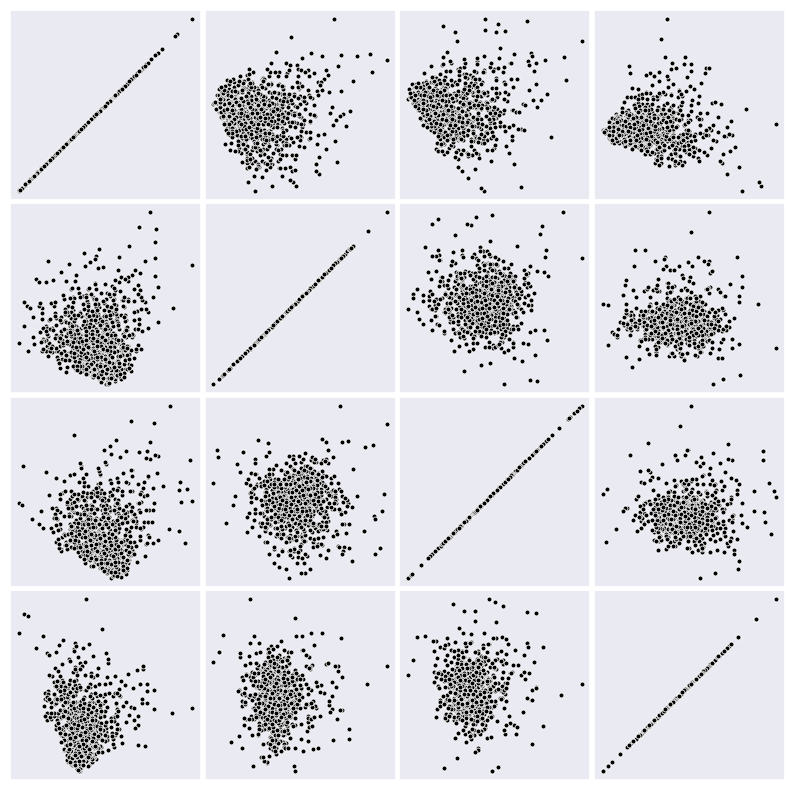

In [36]:
pca_components = decomposition(img_embeddings, n_components=4)

fig, ax = plt.subplots(4, 4, figsize=(10, 10))

for i in itertools.product(pca_components.columns, range(4)):
    sns.scatterplot(x=pca_components[i[0]], y=pca_components[i[1]], s=50, color="black", marker=".", ax=ax[i])
    plt.sca(ax[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')

plt.subplots_adjust(hspace = 0.02, wspace = 0.02)
# plt.tight_layout()
plt.show()
plt.close()

Присоединим эмбеддинги к исходному датасету.

In [37]:
train_data['text_embeddings'] = [txt for txt in text_embeddings]

train_data = train_data.merge(
        pd.DataFrame(
            {'image': img_embeddings_names,
             'img_embeddings': [img for img in img_embeddings]}
        ),
        on='image',
        how='left'
    )

display(train_data.head(3))

,image,query_id,query_text,query_approvement,unadult_flag,text_embeddings,img_embeddings
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,0,"[0.20487832, 0.108171135, 0.047054067, 0.07383...","[0.0, 0.0, 0.020331506, 0.0, 1.9893448, 0.0, 0..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0,1,"[-0.073294535, 0.00051046745, 0.002915788, 0.0...","[0.0, 0.0, 0.020331506, 0.0, 1.9893448, 0.0, 0..."
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0,1,"[0.031941608, 0.12872002, 0.1455196, 0.0244589...","[0.0, 0.0, 0.020331506, 0.0, 1.9893448, 0.0, 0..."


### Бинарная классификация - анализ возможности
Возможно, что модель будет эффективней если мы переведём задачу в русло бинарной классификации (подходит изображение к запросу или нет).    

Предположительно, для каждого изображения есть хоть один запрос с высоким рейтингом соответствия. Проверим эту гипотезу.

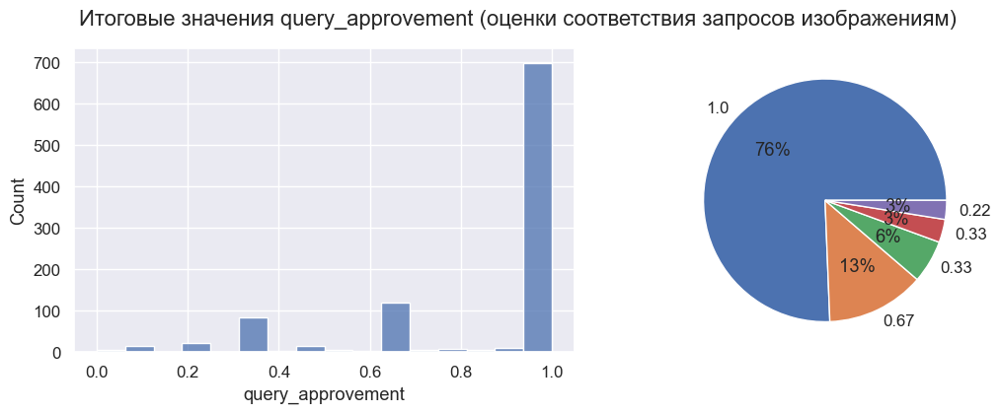

In [38]:
query_approvement_max = train_data.groupby('image', as_index=False).agg({'query_approvement': 'max'})['query_approvement']

query_approvement_max_pie = query_approvement_max.value_counts().head(5)
query_approvement_max_pie.index = np.round(query_approvement_max_pie.index, 2)

fig, ax = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'width_ratios': [1.5, 1]})

sns.histplot(query_approvement_max, ax=ax[0])
ax[1] = plt.pie(query_approvement_max_pie, labels=query_approvement_max_pie.index, autopct='%.0f%%')

plt.suptitle('Итоговые значения query_approvement (оценки соответствия запросов изображениям)')
plt.show()
plt.close()

Для 76% изображений есть хотя бы один запрос с вероятностью совпадения 1.0, еще для 13% - с вероятностью совпадения 0.67.   

На оновании этого подготовим дополнительный бинарный целевой признак, с порогом 0.75.

In [39]:
train_data['query_approvement_binary'] = train_data['query_approvement'].apply(lambda x: 1 if x >= .75 else 0)
display(train_data[['query_approvement', 'query_approvement_binary']].head(10))

,query_approvement,query_approvement_binary
0,1.000000,1
1,0.000000,0
2,0.000000,0
3,0.000000,0
4,0.000000,0
5,0.000000,0
6,0.000000,0
7,0.333333,0
8,0.000000,0
9,0.000000,0


В данном разделе:
- Получены эмбеддинги для текста (тренировочные данные)
- Получены эмбеддинги для изображений (тренировочные данные)
- проведен дополнительный анализ возможности применения бинарнойклассификации
- добавлены дополнительные бинарные метки целевого признака

## Разработка модели
### Подготовка признаков

In [40]:
class FeaturesPrepare:
    '''
    Модуль предназначен для склеивания признаков в один вектор
    и, при необходимости, понижения размерности признаков
    '''
    
    def __init__(self,
                 text,
                 image,
                decomposing_text = False,
                decomposing_image = False,
                decomposing_text_method = 'exact',
                decomposing_text_model = 'pca',
                decomposing_text_n = 2,
                decomposing_image_method = 'exact',
                decomposing_image_model = 'pca',
                decomposing_image_n = 2
                ):
        
        self.text = text
        self.image = image
        self.decomposing_text = decomposing_text
        self.decomposing_image = decomposing_image
        self.decomposing_text_method = decomposing_text_method
        self.decomposing_text_model = decomposing_text_model
        self.decomposing_text_n = decomposing_text_n
        self.decomposing_image_method = decomposing_image_method
        self.decomposing_image_model = decomposing_image_model
        self.decomposing_image_n = decomposing_image_n
        
        if type(self.text) == pd.Series:
            self.text = np.array(self.text.tolist())
        if type(self.image) == pd.Series:
            self.image = np.array(self.image.tolist())
    
    # понижение размерности признаков
    def _decomposer(self, data, model, n_components, method):
        self.decomposed_data = None
        
        try:
            if model == 'pca':
                model = PCA(n_components=n_components, random_state=RANDOM_ST)
            if model == 'tsne':
                model = TSNE(n_components=n_components, method=method, random_state=RANDOM_ST)

            self.decomposed_data = model.fit_transform(data)
            
        except Exception as ex:
            print(ex)
        
        return self.decomposed_data
    
    # "склеивание" признаков в один вектор
    def _concatenation(self):
        a_data = self.text
        b_data = self.image
        
        if self.decomposing_text:            
            a = self._decomposer(data = a_data,
                                 model = self.decomposing_text_model,
                                 method = self.decomposing_text_method,
                                 n_components = self.decomposing_text_n)
        else:
            a = a_data
            
        if self.decomposing_image:            
            b = self._decomposer(data = b_data,
                                 model = self.decomposing_image_model,
                                 method = self.decomposing_image_method,
                                 n_components = self.decomposing_image_n)
        else:
            b = b_data
        
        self.concatenated_features = np.concatenate([a, b], axis=1)
        return self.concatenated_features    

    def output(self, output_type='list'):
        output_features = self._concatenation()
        if output_type == 'array':
            return output_features
        elif output_type == 'list':
            return [i for i in output_features]
        else:
            print('Input correct output_type')
            

In [41]:
class SamplesPrepare:
    
    '''
    Модуль для разделения данных на учебную и валидационную выборки    
    '''
    
    def __init__(self, data=train_data, no_outliers=True, smote=True, 
                 group_col='image', features_col='features', target_col='query_approvement'):
        self.data = data
        self.no_outliers = no_outliers
        self.smote = smote
        self.group_col = group_col
        self.features_col = features_col
        self.target_col = target_col
    
    # разделение на выборки по группам изображений
    def _split(self):
        data = self.data
        
        group_split = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_ST)
        
        train_indices, val_indices = next(group_split.split(data, groups=data[self.group_col]))
        
        X_train = np.array(data.loc[train_indices, [self.features_col]][self.features_col].tolist())
        X_val = np.array(data.loc[val_indices, [self.features_col]][self.features_col].tolist())        
        
        y_train = np.array(data.loc[train_indices, [self.target_col]][self.target_col].tolist())        
        y_val = np.array(data.loc[val_indices, [self.target_col]][self.target_col].tolist())
        
        
        self.val_index = val_indices
        
        return X_train, X_val, y_train, y_val
    
    # получение индекса валидационной группы
    def get_validation_index(self):
        return self.val_index
        
    def output(self):
        X_train, X_val, y_train, y_val = self._split()
        if self.smote:
            try:
                X_train, y_train = (
                        SMOTE(sampling_strategy='minority', random_state=RANDOM_ST)
                        .fit_resample(X_train, y_train)
                    )
            except ValueError as val_er:
                print("ВНИМАНИЕ")
                print("Невозможно использовать SMOTE с небинарными признаками.")
                
        return X_train, X_val, y_train, y_val        

In [42]:
def data_call_and_scale(
            data=train_data,
            text_data=train_data['text_embeddings'],
            img_data=train_data['img_embeddings'],
            decomposing_text=False,
            decomposing_image=False,
            decomposing_text_n=2,                     
            decomposing_image_n=2,
            no_outliers=True,
            smote=True,
            group_col='image',
            features_col='features',
            target_col='query_approvement_binary',
            scaler=MaxAbsScaler()
        ):
    
    '''
    Данная функция объединяет модули FeaturesPrepare и SamplesPrepare
    что сокращает количество последующего кода
    '''

    fp = FeaturesPrepare(
                text_data,
                img_data,
                decomposing_text=decomposing_text,
                decomposing_image=decomposing_image,
                decomposing_text_n=decomposing_text_n,                     
                decomposing_image_n=decomposing_image_n,                
            )
    data[features_col] = pd.Series(fp.output())

    sp = SamplesPrepare(
                no_outliers=no_outliers,
                smote=smote,
                group_col=group_col,
                features_col=features_col,
                target_col=target_col
            )
    
    
    
    X_train, X_val, y_train, y_val = sp.output()    
    indexes = sp.get_validation_index()
    
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_val = scaler.transform(X_val)
    
    return X_train, X_val, y_train, y_val, indexes

В данном разделе
- Подготовлены модули, переводящие данные в удобоваримый для машинного обучения вид
- Модуль для склеивания векторов текста и изображений, а также опционального сокращения размерности признаков
- Модуль для разделения на подвыборки (учебную и тренировочную) с возможностью досемплирования (если задача - бинарная классификация)
- Вспомогательная функция

## Линейная регрессия
Опробуем простой вариант - линейную регрессию. 

In [43]:
X_train, X_val, y_train, y_val, val_indexes = data_call_and_scale(smote=False, target_col='query_approvement')

print(X_train.shape)
print(y_train.shape)
print()
print(X_val.shape)
print(y_val.shape)

(34932, 2560)
(34932,)

(15282, 2560)
(15282,)


In [44]:
def plot_regression(pred, val=y_val):
    '''
    Функция для отрисовки распределения истинных значений и предсказаний модели
    '''
    fig, ax = plt.subplots(figsize=(10, 4))

    c1 = 'steelblue'
    c2 = 'darkorange'
    sns.kdeplot(pred, c=c1, label='predictions')
    sns.kdeplot(val, c=c2, label='true')
    sns.rugplot(pred, height=-.015, clip_on=False, c=c1)
    sns.rugplot(val, height=.02, clip_on=True, c=c2)
    
    plt.legend()
    plt.xlabel('Predictions')
    plt.show()
    plt.close()
    
    print(f"RMSE: {np.sqrt(mean_squared_error(train_data.loc[val_indexes, 'query_approvement'], pred)):.4f}")
    print(f"R2: {r2_score(train_data.loc[val_indexes, 'query_approvement'], pred):.4f}")    

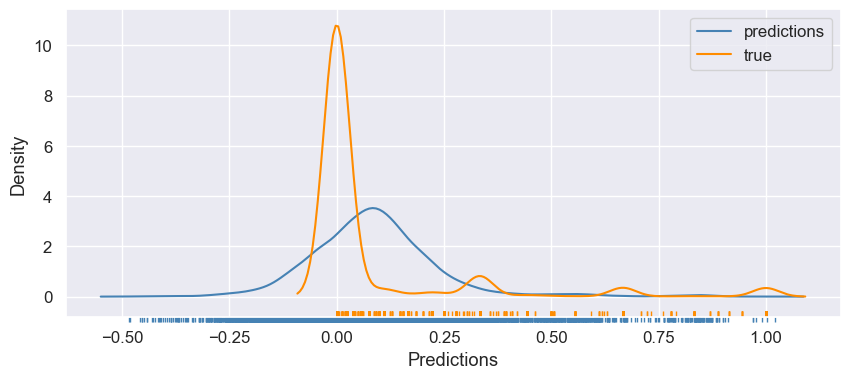

RMSE: 0.2485
R2: -0.4035


In [45]:
lr = LinearRegression()
lr.fit(X_train, y_train)

raw_predictions = lr.predict(X_val)
plot_regression(raw_predictions)

Педсказания линейной регрессии выходят за рамки диапазона (0-1)   

Попробуем применить к результату сигмоидальную функцию.

In [46]:
def sigmoid(array):
    return 1 / (1 + np.exp( -(array + abs(array.min())) / array.max()))

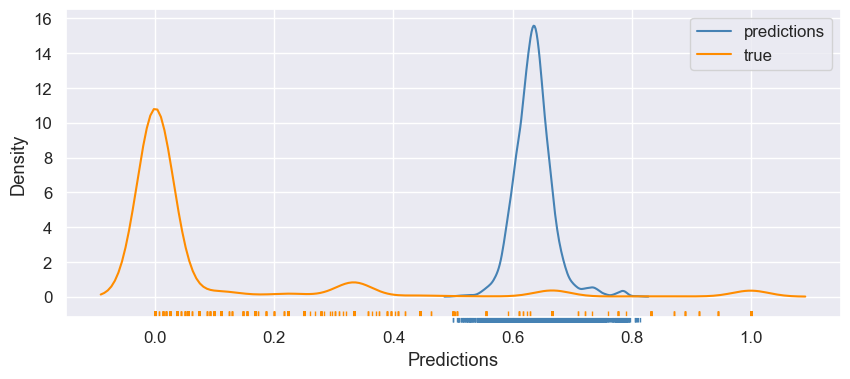

RMSE: 0.5958
R2: -7.0685


In [47]:
predictions_sigm = sigmoid(raw_predictions)
plot_regression(predictions_sigm)

# predictions_boxcox = boxcox(raw_predictions + abs(raw_predictions.min()) + 1)[0]
# plot_regression(sigmoid(predictions_boxcox))

Значения располагаются теперь в рамках диапазона вероятностей, однако они сильно скучены и не представляют возможности для интерпретации.

## Нейросеть
Попробуем получить предсказания с помощью нейросети. Она будет разработана на основе фреймворка Keras.

План создания нейросети:
- Сеть имеет переменное количество слоев
- Кол-во слоев можно задавать при инициализации
- Также можно указать желаемое количество узлов, коэффициенты регуляризации
- В качестве оптимизатора используется Adam
- Сеть может быть как регрессионной так и выполняющей бинарную классификацию (задаётся при инициализации)
- В зависимости от режима используются разные функции потерь (бинарная кроссэнтропия или среднеквадратичная ошибка) и метрики (полнота+f1 или RMSE)
- Функция активации выходного слоя в любом случае сигмоида, так как необходимо получить предсказания в диапазоне (0-1)

In [48]:
class Net:    
    
    def __init__(self,
                 binary=True,
                 layers_cnt = 3,
                 optimizer_lr = 0.001,
                 batch_size = 1000,
                 epochs = 100,
                 verbose = 1,
                 units_list=None,
                 units_divider_list=[4, 16, 40, 100, 500],                 
                 lr_list=[0.025, 0.025, 0.025, 0.025, 0.025]):
        
        self.binary = binary
        self.batch_size = batch_size
        self.epochs = epochs
        self.verbose = verbose
        self.input_n = X_train.shape[1]
        self.layers_cnt = layers_cnt
        self.optimizer_lr = optimizer_lr
        self.units_list=units_list
        self.units_divider_list=units_divider_list
        self.lr_list=lr_list
        
        if not self.units_list:
            self.units_list = [self.input_n // i for i in self.units_divider_list]
            
    # инициализация сети
    def build(self):
        optimizer = Adam(learning_rate=self.optimizer_lr)
        if self.binary == True:
            loss = BinaryCrossentropy()
            metric = Recall()
        else:
            loss = MeanSquaredError()
            metric = RootMeanSquaredError()
            
        leaky_relu = LeakyReLU(alpha=0.1)

        model = Sequential()

        model.add(Dense(units = self.units_list[0],
                        input_shape=(self.input_n,),
                        activation='relu',
                        kernel_regularizer=l2(self.lr_list[0]),
                        kernel_initializer='he_normal'
                       )
                 )
        
        for i in range(self.layers_cnt-1):
            model.add(BatchNormalization())
            model.add(Dense(units = self.units_list[i + 1],
                        activation=leaky_relu,
                        kernel_regularizer=l2(self.lr_list[i + 1]),
                        kernel_initializer='he_normal'
                       )
                 )
            
        model.add(Dense(1,
                        activation='sigmoid'
                       )
                 )

        model.compile(loss=loss, metrics=metric, optimizer=optimizer)
        
        self.model = model
        return self.model
    
    # вывод информации
    def summary(self):
        return self.build().summary()
    
    # обучение
    def train(self, X_train=X_train, y_train=y_train, X_val=X_val, y_val=y_val,
              steps_per_epoch=None, validation_steps=None):
        
        self.X_train = X_train
        self.y_train = y_train
        self.X_val = X_val
        self.y_val = y_val
        self.steps_per_epoch = steps_per_epoch
        self.validation_steps = validation_steps
        
        model = self.build()
        
        # сохранение наилучшей эпохи
        checkpoint = ModelCheckpoint("best_model.h5", save_best_only=True)
        
        self.history = model.fit(
                        x=self.X_train,
                        y=self.y_train,
                        validation_data=(self.X_val, self.y_val),
                        batch_size=self.batch_size,
                        epochs=self.epochs,
                        steps_per_epoch=steps_per_epoch,
                        validation_steps=validation_steps,
                        verbose = self.verbose,
                        callbacks=[checkpoint]
                    )
        
        self.model = model               
        return model
    
    # вывод истории обучения
    def train_history(self):
        return self.history.history
    
    def load_weights(self, file):
        self.model.load_weights(file)
    
    def predict(self, X):
        self.X = X
        return self.model.predict(self.X).flatten()

In [49]:
def plot_train_result(history):
    '''
    Вспомогательная функция для отрисовки процесса обучения
    '''
    
    history1 = history[list(history.keys())[1]]
    history2 = history[list(history.keys())[3]]    

    fig, ax = plt.subplots(figsize=(10, 4))

    sns.lineplot(x=[i for i in range(len(history1))],
                 y = history1, label='train')
    sns.lineplot(x=[i for i in range(len(history2))],
                 y = history2, label='validation')

    plt.ylabel('RMSE')
    plt.show()
    plt.close()
        
def plot_confusion_matrix(net_preds, binary_threshold=.5):    
    '''
    Вспомогательная функция для матрицы ошибок
    '''
    net_preds_binary = [1 if i > binary_threshold else 0 for i in net_preds]

    fig, ax = plt.subplots(figsize=(4, 4))

    sns.heatmap(confusion_matrix(train_data.loc[val_indexes, 'query_approvement_binary'], net_preds_binary),
                annot=True, cmap="Blues", fmt=".0f", cbar=False, 
                linewidths=10, annot_kws={'size': 12}, square = True)

    plt.xlabel('pred')
    plt.ylabel('true')
    plt.show()
    plt.close()

    print(f"f1: {f1_score(train_data.loc[val_indexes, 'query_approvement_binary'], net_preds_binary)}")
    print(f"accuracy: {accuracy_score(train_data.loc[val_indexes, 'query_approvement_binary'], net_preds_binary)}")
    print(f"recall: {recall_score(train_data.loc[val_indexes, 'query_approvement_binary'], net_preds_binary)}")

При дальнейшей проверке моделей будут изучены как метрики регрессии (RMSE, R2) так и метрики классификации (recall, f1, матрица ошибок), так как в случае с поставленной задачей оба пути решения достаточно близки.    

Выводы по результатам обучения - в конце раздела.


### Сеть 1
- Регрессионная модель
- 2560 признаков
- 3 слоя
- 256, 32 и 8 нейронов

In [50]:
X_train, X_val, y_train, y_val, val_indexes = data_call_and_scale(
                                            decomposing_text=False,
                                            decomposing_image=False,
                                            decomposing_text_n=8,
                                            decomposing_image_n=16,
                                            smote=False,
                                            target_col='query_approvement')
print(X_train.shape)
print(y_train.shape)
print()
print(X_val.shape)
print(y_val.shape)

(34932, 2560)
(34932,)

(15282, 2560)
(15282,)


In [51]:
net1 = Net(binary=False,
          layers_cnt=3,
          optimizer_lr=0.0001,
          batch_size=200,
          epochs=80,
          units_list=[256, 32, 8],
          lr_list = [0.0001, 0.0001, 0.0001],
          verbose=0)
net1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               655616    
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 32)                8224      
                                                                 
 batch_normalization_1 (Bat  (None, 32)                128       
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 8)                 264       
                                                                 
 dense_3 (Dense)             (None, 1)                

In [52]:
t1 = time.time()
net1.train(X_train=X_train, X_val=X_val, y_train=y_train, y_val=y_val)

best_net1 = load_model("best_model.h5")
print(f"done in {time.time() - t1:.0f} sec")

done in 152 sec


478/478 [==============================] - 1s 1ms/step


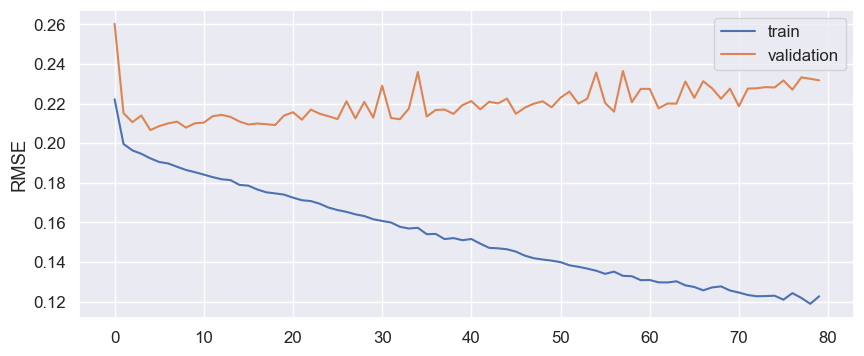

In [53]:
net1_preds = net1.predict(X_val).flatten()
history1 = net1.train_history()
plot_train_result(history1)

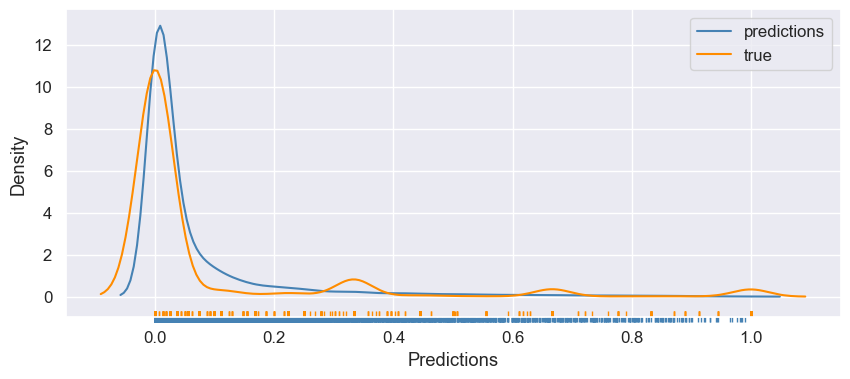

RMSE: 0.2317
R2: -0.2207


In [54]:
plot_regression(net1_preds, train_data.loc[val_indexes, 'query_approvement'])

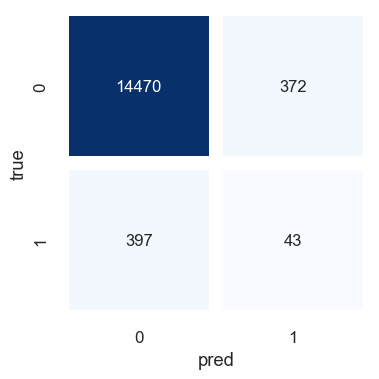

f1: 0.10058479532163743
accuracy: 0.9496793613401388
recall: 0.09772727272727273


In [55]:
plot_confusion_matrix(net1_preds, .5)

### Сеть 2
- Регрессионная модель
- 2560 признаков
- 3 слоя
- 2048, 1536 и 32 нейрона

In [56]:
X_train, X_val, y_train, y_val, val_indexes = data_call_and_scale(
                                            decomposing_text=False,
                                            decomposing_image=False,
                                            decomposing_text_n=3,
                                            decomposing_image_n=4,
                                            smote=False,
                                            target_col='query_approvement')

print(X_train.shape)
print(y_train.shape)
print()
print(X_val.shape)
print(y_val.shape)

(34932, 2560)
(34932,)

(15282, 2560)
(15282,)


In [57]:
net2 = Net(binary=False,
          layers_cnt=3,
          optimizer_lr=0.0001,
          batch_size=200,
          epochs=80,
          units_list=[2048, 1536, 32],
          lr_list = [0.0001, 0.0001, 0.0001],
          verbose=0)
net2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 2048)              5244928   
                                                                 
 batch_normalization_4 (Bat  (None, 2048)              8192      
 chNormalization)                                                
                                                                 
 dense_9 (Dense)             (None, 1536)              3147264   
                                                                 
 batch_normalization_5 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_10 (Dense)            (None, 32)                49184     
                                                                 
 dense_11 (Dense)            (None, 1)                

In [58]:
t1 = time.time()
net2.train(X_train=X_train, X_val=X_val, y_train=y_train, y_val=y_val)

best_model2 = load_model("best_model.h5")
print(f"done in {time.time() - t1:.0f} sec")

done in 1088 sec


478/478 [==============================] - 4s 7ms/step


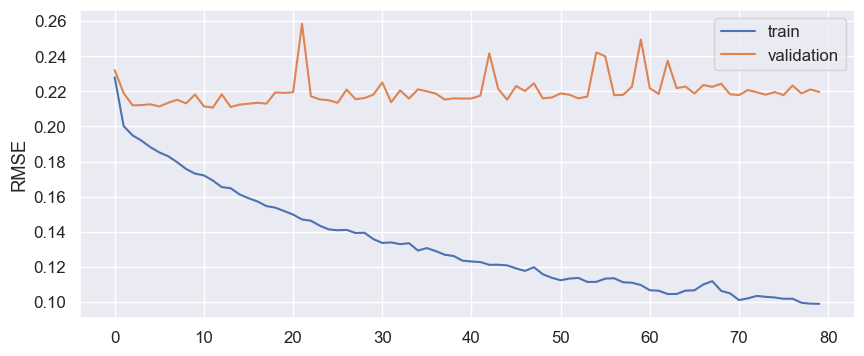

In [59]:
net2_preds = net2.predict(X_val).flatten()
history2 = net2.train_history()
plot_train_result(history2)

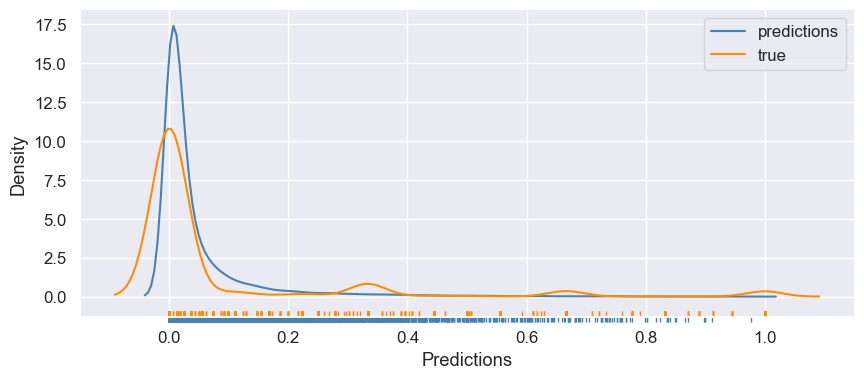

RMSE: 0.2197
R2: -0.0972


In [60]:
plot_regression(net2_preds, train_data.loc[val_indexes, 'query_approvement'])

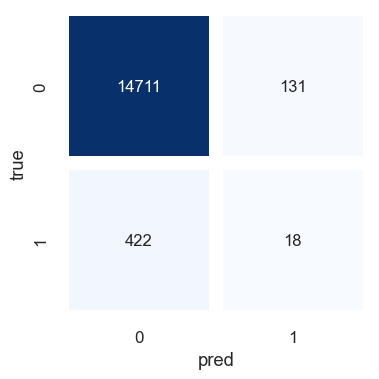

f1: 0.06112054329371817
accuracy: 0.9638136369585133
recall: 0.04090909090909091


In [61]:
plot_confusion_matrix(net2_preds, .5)

### Сеть 3
- Регрессионная модель
- 7 признаков (уменьшена размерность)
- 4 слоя
- 2048, 512, 32 и 8 нейронов

In [62]:
X_train, X_val, y_train, y_val, val_indexes = data_call_and_scale(
                                            decomposing_text=True,
                                            decomposing_image=True,
                                            decomposing_text_n=3,
                                            decomposing_image_n=4,
                                            smote=False,
                                            target_col='query_approvement')

print(X_train.shape)
print(y_train.shape)
print()
print(X_val.shape)
print(y_val.shape)

(34932, 7)
(34932,)

(15282, 7)
(15282,)


In [63]:
net3 = Net(binary=False,
          layers_cnt=4,
          optimizer_lr=0.0001,
          batch_size=200,
          epochs=80,
          units_list=[2048, 512, 32, 8],
          lr_list = [0.0001, 0.0001, 0.0001, 0.0001],
          verbose=0)
net3.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 2048)              16384     
                                                                 
 batch_normalization_8 (Bat  (None, 2048)              8192      
 chNormalization)                                                
                                                                 
 dense_17 (Dense)            (None, 512)               1049088   
                                                                 
 batch_normalization_9 (Bat  (None, 512)               2048      
 chNormalization)                                                
                                                                 
 dense_18 (Dense)            (None, 32)                16416     
                                                                 
 batch_normalization_10 (Ba  (None, 32)               

In [64]:
t1 = time.time()
net3.train(X_train=X_train, X_val=X_val, y_train=y_train, y_val=y_val)

best_model3 = load_model("best_model.h5")
print(f"done in {time.time() - t1:.0f} sec")

done in 352 sec


478/478 [==============================] - 1s 2ms/step


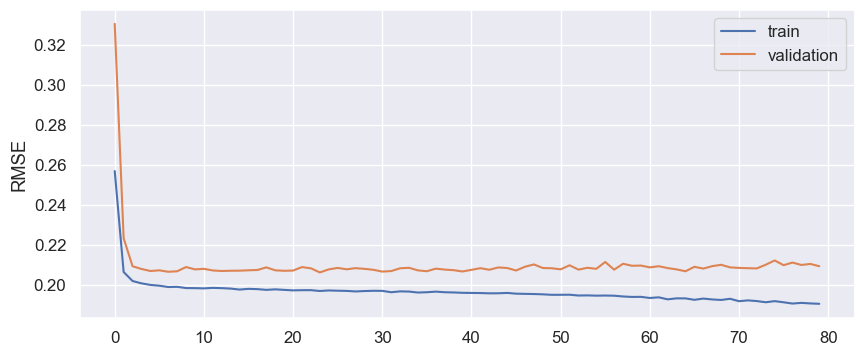

In [65]:
net3_preds = net3.predict(X_val).flatten()
history3 = net3.train_history()
plot_train_result(history3)

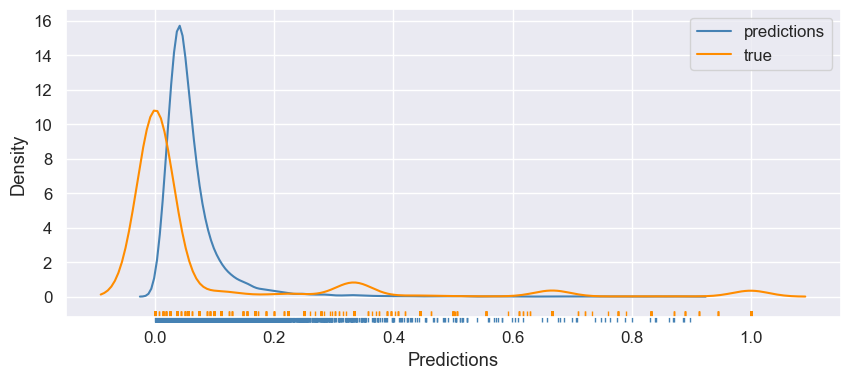

RMSE: 0.2094
R2: 0.0035


In [66]:
plot_regression(net3_preds, train_data.loc[val_indexes, 'query_approvement'])

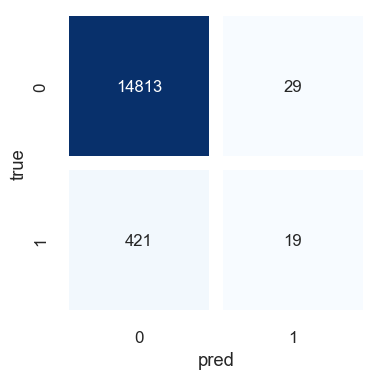

f1: 0.07786885245901641
accuracy: 0.9705535924617197
recall: 0.04318181818181818


In [67]:
plot_confusion_matrix(net3_preds, .5)

### Сеть 4
- Классификационная модель
- 2560 признаков
- 3 слоя
- 128, 32 и 8 нейронов

In [68]:
X_train, X_val, y_train, y_val, val_indexes = data_call_and_scale(
                                            decomposing_text=False,
                                            decomposing_image=False,
                                            decomposing_text_n=3,
                                            decomposing_image_n=4,
                                            smote=True,
                                            target_col='query_approvement_binary')

In [69]:
net4 = Net(binary=True,
          layers_cnt=3,
          optimizer_lr=0.0001,
          batch_size=1000,
          epochs=80,
          units_list=[128, 32, 8],
          lr_list = [0.0001, 0.0001, 0.0001],
          verbose=0)
net4.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 128)               327808    
                                                                 
 batch_normalization_14 (Ba  (None, 128)               512       
 tchNormalization)                                               
                                                                 
 dense_27 (Dense)            (None, 32)                4128      
                                                                 
 batch_normalization_15 (Ba  (None, 32)                128       
 tchNormalization)                                               
                                                                 
 dense_28 (Dense)            (None, 8)                 264       
                                                                 
 dense_29 (Dense)            (None, 1)                

In [70]:
t1 = time.time()
net4.train(X_train=X_train, X_val=X_val, y_train=y_train, y_val=y_val)

best_model4 = load_model("best_model.h5")
print(f"done in {time.time() - t1:.0f} sec")

done in 95 sec


478/478 [==============================] - 1s 1ms/step


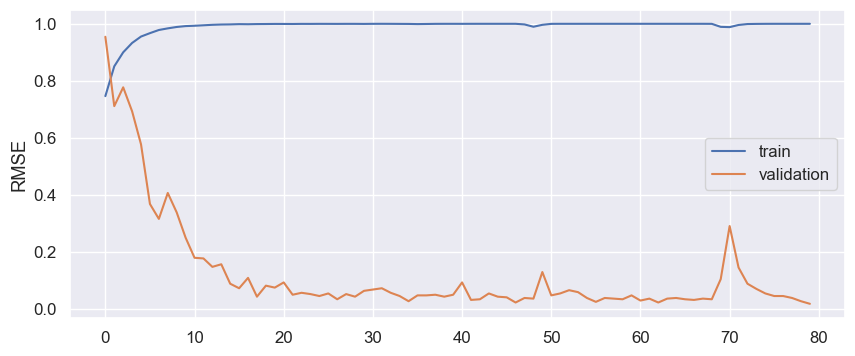

In [71]:
net4_preds = net4.predict(X_val).flatten()
history4 = net4.train_history()
plot_train_result(history4)

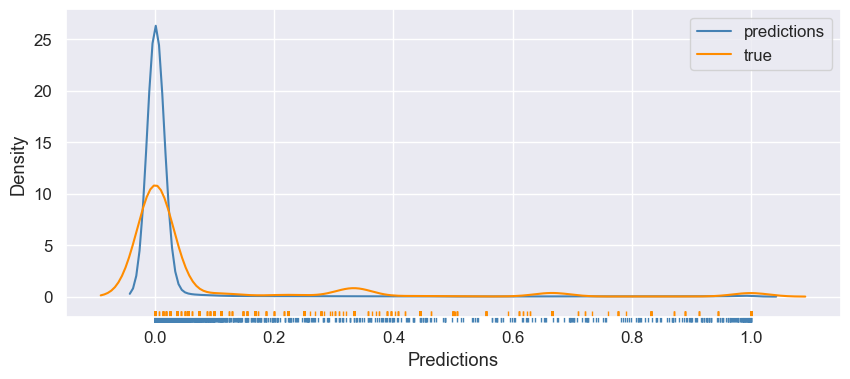

RMSE: 0.2369
R2: -0.2762


In [72]:
plot_regression(net4_preds, train_data.loc[val_indexes, 'query_approvement'])

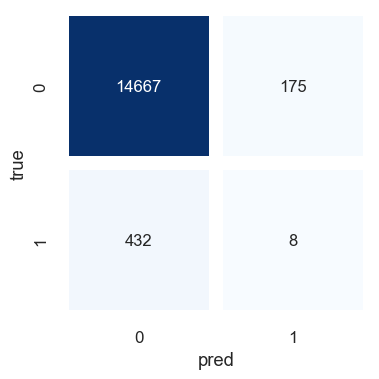

f1: 0.025682182985553772
accuracy: 0.9602800680539196
recall: 0.01818181818181818


In [73]:
plot_confusion_matrix(net4_preds, .5)

В рамках обучения протестировано несколько моделей (3 регрессионные и 1 классификация). Результаты во всех случаях схожи. С точки зрения продуктового применения, результаты нельзя считать удовлетворительными, однако важно, что обучение проводилось на 1000 изображений.    

Как минимум, в рамках первичной проверки подтверждена работоспособность моделей.  

В относительный величинах наилучший результат у сети net3, однако так как разница в результатах минимальная, будем использовать net2, для которой нет необходимости декомпозировать данные.

<div style="border:solid red 1px; padding: 20px">
<b>Сообщение ревьюеру:</b>     
    
Как видишь, результаты неудовлетворительные. Пожалуйста не отправляй проект на доработку в связи с этим, (если только это не какая-то быстрая маленькая доработка 😇).   
Однако, если у тебя есть соображения, что я сделал не так - пожалуйста поделись. Низкое качество обучения, увы, будет заметно на валидации и тесте 😩    

### CLIP модель
Также будет опробована архитектура CLIP (Connecting text and images). Так как модель уже обучена разработчиками, она будет представлена только в разделе валидации и тестирования.

In [74]:
CLIP_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
CLIP_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

## Валидация   
Подготовим данные для валидации: библиотеки эмбеддингов валидационных и тестовых изображений, а также векторынх представлений изображчений для модели CLIP.

In [76]:
# отдальные датасеты для валидации и тестирования
validation_data = train_data.loc[val_indexes, ['image', 'query_text', 'query_approvement']]
validation_images = train_data.loc[val_indexes, ['image', 'img_embeddings']].drop_duplicates('image')
test_images_embed = np.array([img_model.single_image(FOLDER + '/' +
                                                     TEST_IMG_FOLDER + '/' +
                                                     iter_image)[0] for iter_image in test_images['image']])

test_images['img_embeddings'] = [i for i in test_images_embed]

display(validation_data.head(3))
print(validation_data.shape)
display(validation_images.head(3))
print(validation_images.shape)
display(test_images.head(3))
print(test_images.shape)

,image,query_text,query_approvement
129,1084040636_97d9633581.jpg,A white dog has its head on the ground .,1.0
130,1084040636_97d9633581.jpg,"A dog , lying down , tethered to the side mirr...",0.0
131,1084040636_97d9633581.jpg,A black dog bites a white dog while standing o...,0.0


(15282, 3)


,image,img_embeddings
129,1084040636_97d9633581.jpg,"[0.0, 0.0, 0.0018653075, 0.0, 1.8900065, 0.0, ..."
542,113678030_87a6a6e42e.jpg,"[0.0, 0.0, 0.0, 0.0, 1.8022497, 0.0, 0.0071110..."
687,1174525839_7c1e6cfa86.jpg,"[0.0, 0.0, 0.0, 0.0, 1.8385493, 0.0, 0.0072154..."


(300, 2)


,image,img_embeddings
0,3356748019_2251399314.jpg,"[0.0, 0.0, 0.0, 0.0, 1.539268, 0.0, 0.04623808..."
1,2887171449_f54a2b9f39.jpg,"[0.0, 0.0005891117, 0.014688917, 0.0, 1.465270..."
2,3089107423_81a24eaf18.jpg,"[0.0, 0.0, 0.0, 0.0, 1.7236491, 0.0, 0.0424767..."


(100, 2)


In [77]:
# векторные представления изображений (для ускорения работы CLIP)
val_img_array = np.array([img_to_array(load_img(FOLDER + '/' +
                                                TRAIN_IMG_FOLDER + '/' +
                                                image_file, target_size=(250, 250)))
                          for image_file in validation_images['image']])
test_img_array = np.array([img_to_array(load_img(FOLDER + '/' +
                                                 TEST_IMG_FOLDER + '/' +
                                                 image_file, target_size=(250, 250)))
                           for image_file in test_images['image']])

print(val_img_array.shape)
print(test_img_array.shape)

(300, 250, 250, 3)
(100, 250, 250, 3)


**Оценим результат работы лучшей нейросети (net2) на нескольких запросах.**

Параметры net2:  
- Регрессионная модель
- 2560 признаков
- 3 слоя
- 2048, 1536 и 32 нейрона     

Также на валидационной выборке будет проверена работа модели CLIP.    


Логика работы функции проверки:   
- функция принимает на вход текст запроса, данные, обученную сеть
- img_folder - передает значение папки с фотографиями и влияет на логику выбора подвыборки
- флаг CLIP - включает прогнозирование с помощью CLIP.

In [78]:
def make_net_test(text, data, net=net2, CLIP=False, img_folder=TRAIN_IMG_FOLDER):
    '''
    Функция для проведения тестирования и вывода пары - [запрос пользователя : результирующее изображение]
    '''
    if len(re.findall(UNADULTS_STRING, text.lower())) > 0:
        fig, ax = plt.subplots()

        plt.text(x=0.5, y=0.5, s='This image is unavailable\nin your country\nin compliance with local laws.',
                 ha='center', va='center')

        plt.xticks([])
        plt.yticks([])

        plt.show()
        plt.close()
        
        print(text)
        
        return None
    
    else:
    
        if CLIP == True:        
            max_probability = -1        
            best_image = None

            if img_folder == TRAIN_IMG_FOLDER:
                img_arrays = val_img_array
            else:
                img_arrays = test_img_array

            for image_file, i in zip(data['image'], range(len(data['image']))):            
                img = img_arrays[i]
                text_and_image = CLIP_processor(text=text, images=img, return_tensors="pt", padding=True)

                output = CLIP_model(**text_and_image)
                logits_per_image = output.logits_per_image            
                pred = logits_per_image #.softmax(dim=1)

                best_pred = pred.max().item()
                if best_pred > max_probability:
                    max_probability = best_pred
                    best_image = image_file

            plt.grid(False)
            plt.imshow(load_img(FOLDER + '/' + img_folder + '/' + best_image))

            plt.xticks([])
            plt.yticks([])

            plt.show()
            plt.close()

            print(text)

        else:

            text_emb = text_transformer.single_text(text)

            text_emb_multiplyed = np.array([text_emb for _ in range(len(data))])
            imgs_emb = np.array([i for i in data['img_embeddings']])

            y_test = np.concatenate([text_emb_multiplyed, imgs_emb], axis=1)

            pred = net.predict(y_test)

            best_image = data.iloc[np.argmax(pred)][0]

            plt.grid(False)
            plt.imshow(load_img(FOLDER + '/' + img_folder + '/' + best_image))

            plt.xticks([])
            plt.yticks([])

            plt.show()
            plt.close()

            print(text)

Выберем 5 случайных запросов:

In [79]:
validation_data_sample = validation_data.sample(5, random_state=601)
display(validation_data_sample)
val_sample_idx = validation_data_sample.index

,image,query_text,query_approvement
36946,3578914491_36019ba703.jpg,Three dogs are running in a field .,0.0
24048,3108732084_565b423162.jpg,A man kneels in the snow .,0.0
12730,2501595799_6316001e89.jpg,A dog leaps over a red and blue jump .,0.0
14121,2581066814_179d28f306.jpg,"A woman wearing black clothes , a purple scarf...",0.0
1573,1329832826_432538d331.jpg,Two girls pass two boys by a tree in a neon li...,0.0


#### Валидация с использованием net2

10/10 [==============================] - 0s 6ms/step


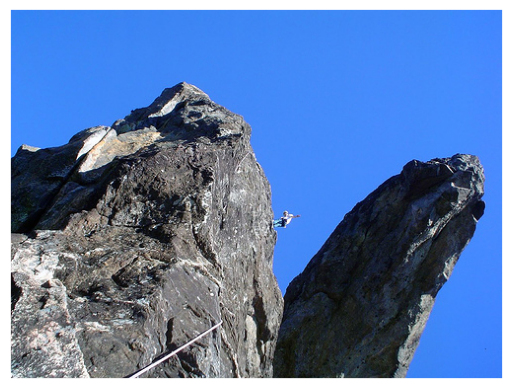

Three dogs are running in a field .


In [80]:
make_net_test(validation_data.loc[val_sample_idx[0], 'query_text'], validation_images, CLIP=False)

Результат первой проверки неудовлетворительный.

10/10 [==============================] - 0s 6ms/step


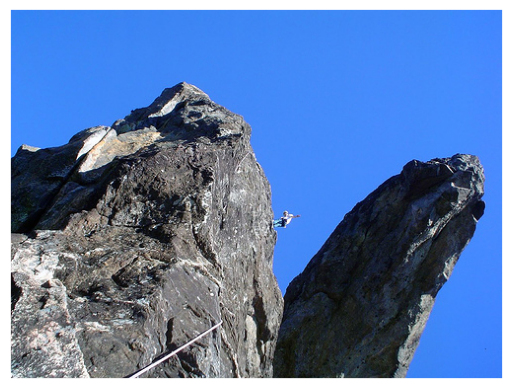

A man kneels in the snow .


In [81]:
make_net_test(validation_data.loc[val_sample_idx[1], 'query_text'], validation_images, CLIP=False)

Модель возвращает то же изображение. 

10/10 [==============================] - 0s 6ms/step


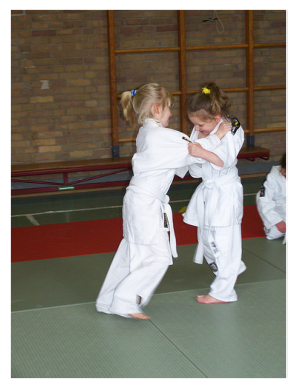

A dog leaps over a red and blue jump .


In [82]:
make_net_test(validation_data.loc[val_sample_idx[2], 'query_text'], validation_images, CLIP=False)

И тут результат неудовлетворительный. Предположительно, причина этого - проблема при обучении сети.

<div style="border:solid red 1px; padding: 20px">
<b>Сообщение ревьюеру:</b>     
    
Можно было бы предположить, что где-то по ошибке я передаю модели один и тот же тензор, но нет. Предсказания для разных запросов различаются, просто для одной и той же картинки вероятность совпадения всегда стабильно выше 😨😩  

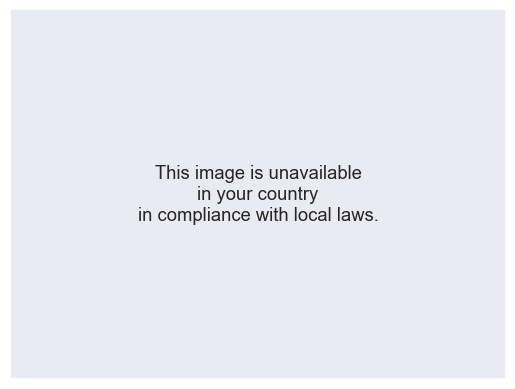

Two girls pass two boys by a tree in a neon lit street .


In [83]:
make_net_test(validation_data.loc[val_sample_idx[4], 'query_text'], validation_images, CLIP=False)

Блокировка изображений, демонстрация которых ограничена законодательством, исправно работает.

#### Валидация с использованием CLIP

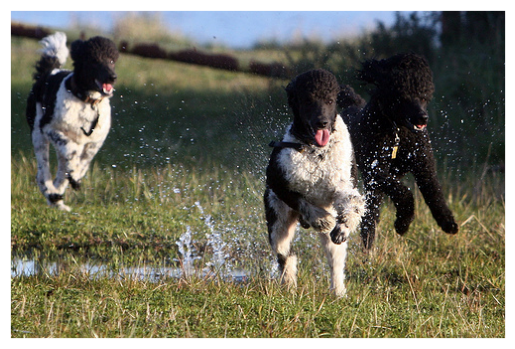

Three dogs are running in a field .


In [84]:
make_net_test(validation_data.loc[val_sample_idx[0], 'query_text'], validation_images, CLIP=True)

Идеальное совпадение.

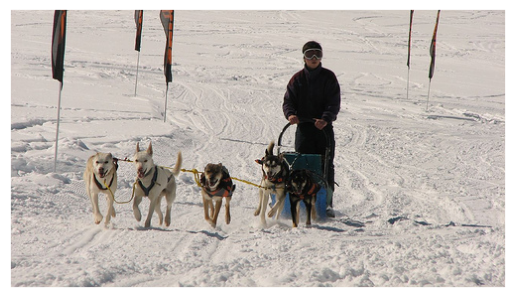

A man kneels in the snow .


In [85]:
make_net_test(validation_data.loc[val_sample_idx[1], 'query_text'], validation_images, CLIP=True)

Тут частичное совпадение: есть снег, есть человек, но он не стоит на коленях )   

Проведем дополнительную проверку

,image,query_text,query_approvement
42802,485245061_5a5de43e20.jpg,A man kneels in the snow .,1.00000
38934,3641022607_e7a5455d6c.jpg,A man kneels in the snow .,0.04321


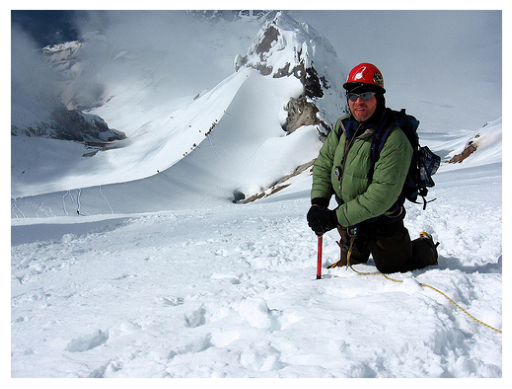

In [86]:
display(
    validation_data[validation_data['query_text'] == validation_data.loc[val_sample_idx[1], 'query_text']]
    .nlargest(2, 'query_approvement')
       )

plt.grid(False)
plt.imshow(load_img(FOLDER + '/' + TRAIN_IMG_FOLDER + '/' + '485245061_5a5de43e20.jpg'))

plt.xticks([])
plt.yticks([])
plt.show()
plt.close()

Действительно, вот более адекватное изображение.

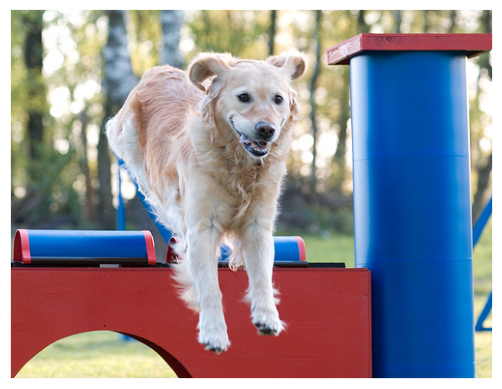

A dog leaps over a red and blue jump .


In [87]:
make_net_test(validation_data.loc[val_sample_idx[2], 'query_text'], validation_images, CLIP=True)

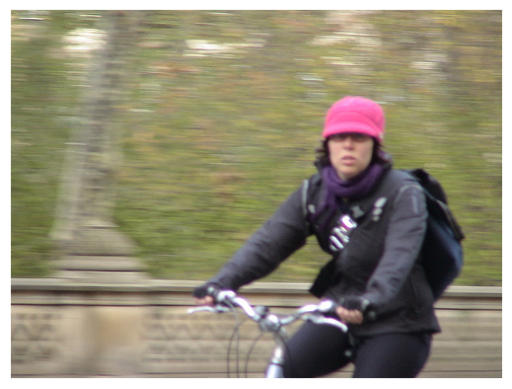

A woman wearing black clothes , a purple scarf , and a pink hat is riding a bike .


In [88]:
make_net_test(validation_data.loc[val_sample_idx[3], 'query_text'], validation_images, CLIP=True)

Данные изорбражения хорошо подходят к текстовым запросам.      

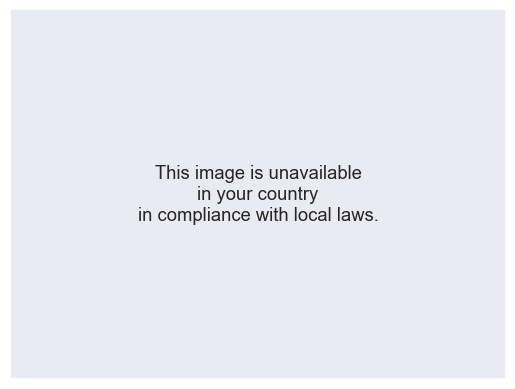

Two girls pass two boys by a tree in a neon lit street .


In [89]:
make_net_test(validation_data.loc[val_sample_idx[4], 'query_text'], validation_images, CLIP=True)

С включенным использованием CLIP нелегальные запросы также блокируются.

В целом, модель CLIP показала преимущество использования готовых решений. Прежде чем принимать решение о выборе, проведем тестирование на отложенной выборке.    

## Тестирование   

In [90]:
test_data_sample = test_queries.sample(7, random_state=602)
display(test_data_sample)
tst_sample_idx = test_data_sample.index

,query_id,query_text,image
337,3438981089_2ef1a6353c.jpg#2,A man on an orange bike .,3438981089_2ef1a6353c.jpg
436,424307754_1e2f44d265.jpg#1,A black dog jumps up to a man 's uplifted hand .,424307754_1e2f44d265.jpg
491,989754491_7e53fb4586.jpg#1,A girl in green goggles in a pool with three o...,989754491_7e53fb4586.jpg
373,3488087117_2719647989.jpg#3,Little brown and white dog running on the side...,3488087117_2719647989.jpg
118,2461990494_c5ece064cc.jpg#3,The man in the backpack looks to his left .,2461990494_c5ece064cc.jpg
139,2552438538_285a05b86c.jpg#4,Three little boys standing next to and on a fe...,2552438538_285a05b86c.jpg
294,3330333217_1a69497a74.jpg#4,"Two people , one in blue and one in red , stan...",3330333217_1a69497a74.jpg


#### Тестирование с использованием net2

4/4 [==============================] - 0s 13ms/step


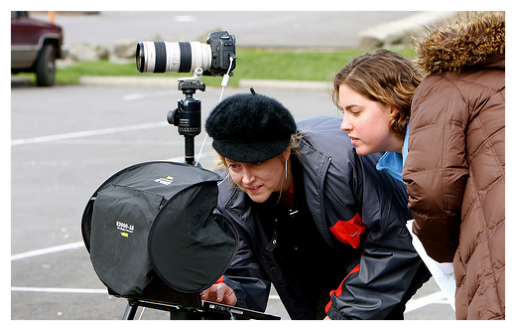

A man on an orange bike .


In [91]:
make_net_test(test_data_sample.loc[tst_sample_idx[0], 'query_text'], test_images, CLIP=False, img_folder=TEST_IMG_FOLDER)

4/4 [==============================] - 0s 9ms/step


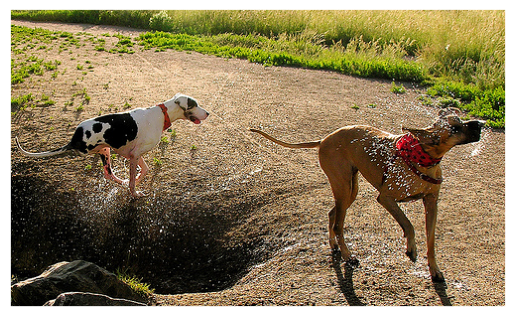

A black dog jumps up to a man 's uplifted hand .


In [92]:
make_net_test(test_data_sample.loc[tst_sample_idx[1], 'query_text'], test_images, CLIP=False, img_folder=TEST_IMG_FOLDER)

Тут хотя бы есть собаки.

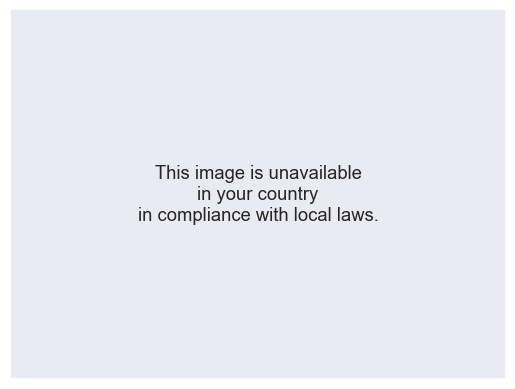

A girl in green goggles in a pool with three other children .


In [93]:
make_net_test(test_data_sample.loc[tst_sample_idx[2], 'query_text'], test_images, CLIP=False, img_folder=TEST_IMG_FOLDER)

Блокировка на тестовой выборке также работает.     

В связи с недостатками сети net2 в её текущей версии, дальше сосредоточимся на тестировании модели CLIP.

#### Тестирование с использованием net2

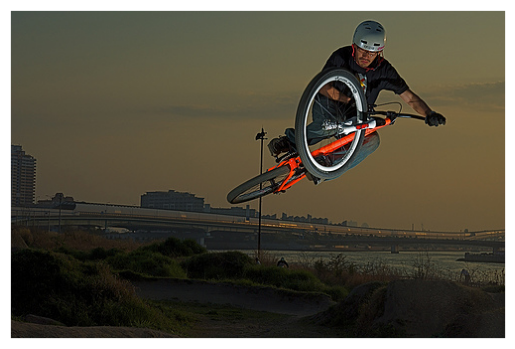

A man on an orange bike .


In [94]:
make_net_test(test_data_sample.loc[tst_sample_idx[0], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

Это фото, объективно, лучше подходит к описанию.

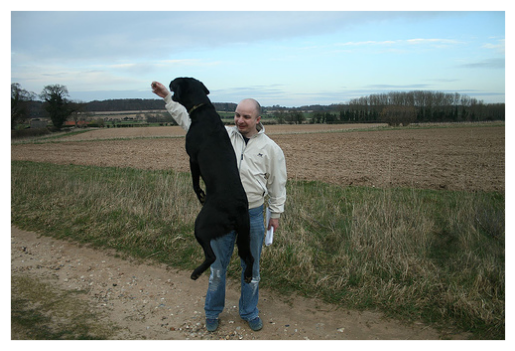

A black dog jumps up to a man 's uplifted hand .


In [95]:
make_net_test(test_data_sample.loc[tst_sample_idx[1], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

Также хорошее совпадение.

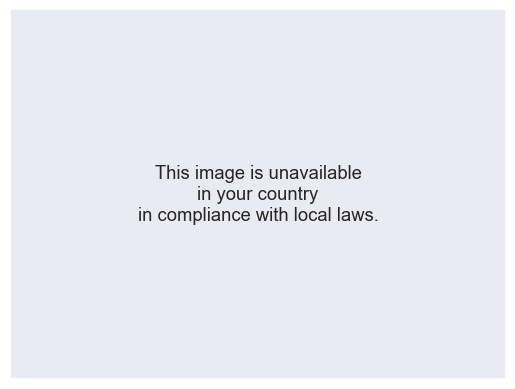

A girl in green goggles in a pool with three other children .


In [96]:
make_net_test(test_data_sample.loc[tst_sample_idx[2], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

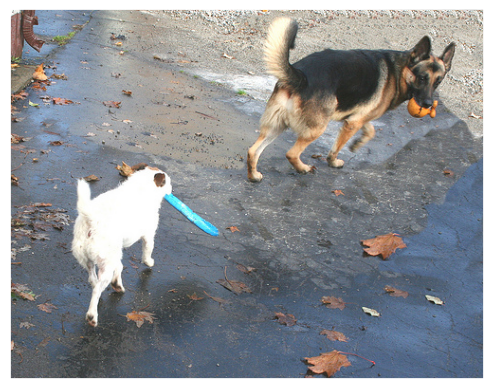

Little brown and white dog running on the sidewalk .


In [97]:
make_net_test(test_data_sample.loc[tst_sample_idx[3], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

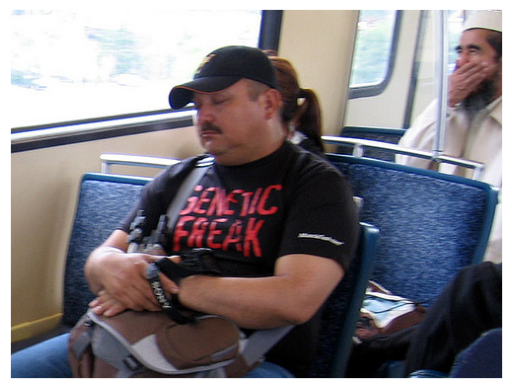

The man in the backpack looks to his left .


In [98]:
make_net_test(test_data_sample.loc[tst_sample_idx[4], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

Здесь совпадение не очень качественное. Действительно есть человек с рюкзаком, но это всё что есть общего.

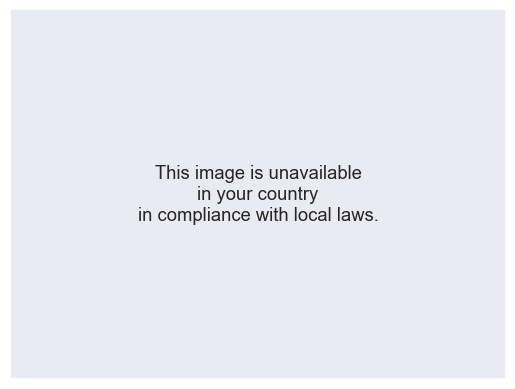

Three little boys standing next to and on a fence .


In [99]:
make_net_test(test_data_sample.loc[tst_sample_idx[5], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

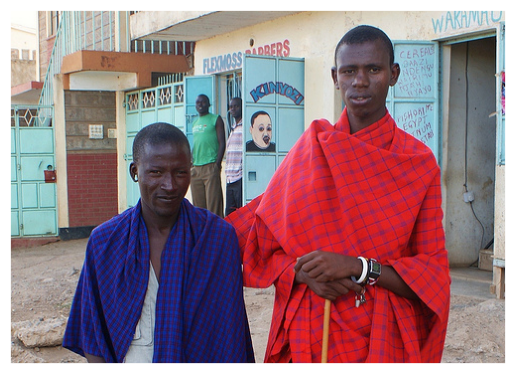

Two people , one in blue and one in red , stand in front of a building .


In [100]:
make_net_test(test_data_sample.loc[tst_sample_idx[6], 'query_text'], test_images, CLIP=True, img_folder=TEST_IMG_FOLDER)

В целом, по результатам тестирования CLIP показывает хорошие результаты - большинство совпадений на очень высоком уровне, малая часть совпадает не полностью.

## Заключение

- В рамках проекта разработана регрессионная **нейросеть прямого распространения**, для поиска совпадений между изображениями и их тектсовыми описаниями. Критерием совпадения (целевым признаком) служит синтетическая оценка, основанная на рейтинге совпадений, подготовленном экспертными и краудсорсинговыми ассессорами.  
Проведенное тестирование показало, что модель возможно использовать для поставленной цели, однако необходимо дополнительно проработать её архитектуру.
Возможные способы улучшения и проблемы:   
 - подбор лучшей архитектуры (требует времени и аппаратных ресурсов)
 - аугментация изображений на стадии загрузки
 - значительное увеличение обучающей выборки (требует аппаратных ресурсов)
 - добавление нишевых тегов к изображениям (например "собака", "спорт", "дети") или предварительная кластеризация изображений (за рамками данного проекта). Такие метки могли бы стать весомым признаком при обучении, а также ускорить предсказания (модель перебирала бы не все изображения, а только из определенной категории)    


- Также в рамках проекта протестирована предобученная модель **CLIP**. Она показала высокое качество предсказаний, однако скорость ее работы ниже желаемой. Именно в этом случае добавление нишевых тегов или кластеризация могли бы улучшить скорость работы.

#### Перспективы реализации проекта  

В целом, проект по созданию сервиса поиска фотографий по текстовому описанию осуществим. Возможные варианты реализации:
- на основе **нейросети прямого распространения** (необходимо доработать модель, увеличить обучающую выборку)
- на основе **трансформера CLIP** (необходима предварительная разметка и/или кластеризация изображений)
- на основе других методов: например **Metric Learning**, который позволяет напрямую сравнивать (после трансформации) векторы описаний и изображений.